# Multivariate Analysis of Borough-level Variables

We have managed to gather many "aggregate" borough-level variables from a variety of sources.

1. The **census** survey gives us microdata of `age`, income-class (hereon referred to as `employment`/employment-type), `education`, (self-reported) `health`, (material) `deprivation`, and also aggregate borough-level indicators of well-being (`anxiety`, `happiness`, `satisfaction`, `worth`).
2. The **USoc** survey gives us `degree_empirical_mean` (number of friends) of people, which can be aggregated in a borough.
3. The **census** survey gives us $\Pi$ for different boroughs which help us learn distribution parameters such as `entropy`/`kld_uniform`(which is the KL-divergence of the borough's distribution to uniform distribution), `kld_global` (which is the KL-divergence of the borough's distribution from the national distribution).
4. The **USoc** survey allows us to learn the block-matrix $\Psi$, which along with $\Pi$ from **census** survey allows us to learn an SBM kernel that can provide statistics (both mean and variance) of network-based measures such as:
    1. degree: `degree_local` (w.r.t. borough distribution), `degree_global` (w.r.t. national distribution), `degree_uniform` (w.r.t. uniform distribution)
    2. heterophily: `heterophily_local` (w.r.t. borough distribution), `heterophily_global` (w.r.t. national distribution)
    3. total variation distance: measuring the deviation of $\boldsymbol\rho$ from $\boldsymbol\pi$, `tvd_self` refers to deviation with regards to one's own community ($[\Psi_{rw}\Pi]_{ii}$ vs $\pi_{i}$) , while `tvd_total` refers to deviation with regards to all communities ($\Psi_{rw}\Pi$ vs. $\boldsymbol\pi$); `tvd_self` can also be seen as a measure of homophily (larger value means more homophily)
    4. centralities: `betweenness`, `betweenness_employment` (w.r.t. highest employment-type `AB`), `betweenness_age` (w.r.t. youngest age group of `20.0`)
5. The learnt SBM kernel can also be used to compute an `eigengap` for every borough, which is a measure of connectivity given by $1-\lambda_2$, where $\lambda_2$ is the second largest (absolute) eigenvalue of $\Pi\Psi_{rw}$.

## Importing Data

All these variables have been stored in files which can be imported, indexed by the `geocode` of the boroughs. We will pursue ordinary-least-squares (OLS) models in our multivariate analysis, to gauge the relevance of different predictors (such as `employment`, `age` and `eigengap`) in explaining the variance of dependent variables (such as `health`, `deprivation`). For a fair comparison, we normalize the data (which is all continuous) to zero-mean-unit-variance. We can also include quadratic interaction terms to incorporate non-linearity in the OLS models.

In [1009]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.api as sm
from statsmodels.formula.api import ols, glm

In [759]:
def import_data(norm=True, interaction=False):
    import pandas as pd
    age = pd.read_csv('age_by_geo.tsv', index_col=0, header=None)
    inc = pd.read_csv('inc_by_geo.tsv', index_col=0, header=None)
    edu = pd.read_csv('edu_by_geo.tsv', index_col=0, header=None)
    hea = pd.read_csv('health_by_geo.tsv', index_col=0, header=None)
    dep = pd.read_csv('dep_by_geo.tsv', index_col=0, header=None)
    wbg = pd.read_csv('wellbeing_census_by_geo.csv', index_col=0)
    wbu = pd.read_csv('wellbeing_usoc_by_geo.csv', index_col=0)
    #deg = pd.read_csv('deg_uk.tsv', index_col=0, sep='\t')
    deg = pd.read_csv('deg_uk.csv', index_col=0)
    gin = pd.read_csv('gini_by_geo.csv', index_col=0)
    
    ent = pd.read_csv('ent_uk.tsv', index_col=0, sep='\t')
    #sas = pd.read_csv('sas_full_uk.tsv', index_col=0, sep='\t')
    sas = pd.read_csv('sas_ind_uk.tsv', index_col=0, sep='\t')
    #sas_ord = pd.read_csv('sas_ord_uk.tsv', index_col=0, sep='\t')
    sas_ord = pd.read_csv('sas_ord_ind_uk.tsv', index_col=0, sep='\t')
    eig = pd.read_csv('eig_rw_uk.tsv', index_col=0, sep='\t')
    eig_ord = pd.read_csv('eig_rw_ord_uk.tsv', index_col=0, sep='\t')
    con = pd.read_csv('con_uk.tsv', index_col=0, sep='\t')
    bwc = pd.read_csv('bwc_rw_uk.tsv', index_col=0, sep='\t')
    bwc_age = pd.read_csv('bwc_age_rw_uk.tsv', index_col=0, sep='\t')
    tvd = pd.read_csv('tvd_uk.tsv', index_col=0, sep='\t')
    
    out = [age, inc, edu, hea, dep]
    names = ['age', 'employment', 'education', 'health', 'deprivation']
    out += [wbg['life-expectancy-male'], wbg['life-expectancy-female']]
    names += ['life-expectancy-male', 'life-expectancy-female']
    out += [wbg['anxiety'], wbg['happiness'], wbg['life-satisfaction'], wbg['worthwhile']]
    names += ['anxiety', 'happiness', 'satisfaction', 'worth']
    out += [wbu['ever had an alcoholic drink'], wbu['ever smoke cigarettes'], wbu['subjective well-being (likert)']]
    names += ['usoc_alcohol', 'usoc_smoking', 'usoc_wellbeing']
    out += [deg['degree_empirical']]
    names += ['degree_empirical_mean']
    out += [gin['age'], gin['education'], gin['income']]
    names += ['gini_age', 'gini_education', 'gini_income']
    
    out += [ent['entropy'], ent['kld global'], ent['kld uniform']]
    names += ['entropy', 'kld_global', 'kld_constpi']
    
    out += [sas['sas mean'], sas['sas var'], sas['sas global mean'], sas['sas global var'], sas['sas const-pi mean'], sas['sas const-pi var']]
    names += ['heterophily_local_mean', 'heterophily_local_var', 'heterophily_global_mean', 'heterophily_local_var', 'heterophily_constpi_mean', 'heterophily_constpi_var']
    
    out += [sas['deg mean'], sas['deg var'], sas['deg global mean'], sas['deg global var'], sas['deg const-pi mean'], sas['deg const-pi var'], sas['deg const-ohm mean'], sas['deg const-ohm var']]
    names += ['degree_local_mean', 'degree_local_var', 'degree_global_mean', 'degree_global_var', 'degree_constpi_mean', 'degree_constpi_var', 'degree_constohm_mean', 'degree_constohm_var']
    
    out += [sas_ord['sas mean'], sas_ord['sas var'], sas_ord['sas global mean'], sas_ord['sas global var'], sas_ord['sas const-pi mean'], sas_ord['sas const-pi var']]
    names += ['ordinal_heterophily_local_mean', 'ordinal_heterophily_local_var', 'ordinal_heterophily_global_mean', 'ordinal_heterophily_global_var', 'ordinal_heterophily_constpi_mean', 'ordinal_heterophily_constpi_var']
    
    out += [sas_ord['deg mean'], sas_ord['deg var'], sas_ord['deg global mean'], sas_ord['deg global var'], sas_ord['deg const-pi mean'], sas_ord['deg const-pi var'], sas_ord['deg const-ohm mean'], sas_ord['deg const-ohm var']]
    names += ['ordinal_degree_local_mean', 'ordinal_degree_local_var', 'ordinal_degree_global_mean', 'ordinal_degree_global_var', 'ordinal_degree_constpi_mean', 'ordinal_degree_constpi_var', 'ordinal_degree_constohm_mean', 'ordinal_degree_constohm_var']
    
    out += [1-eig['eig 2']]
    names += ['eigengap']
    out += [1-eig_ord['eig 2']]
    names += ['ordinal_eigengap']
    out += [con['modal_control mean'], con['modal_control var']]
    names += ['controllability_mean', 'controllability_var']
    out += [bwc['bwc var'], bwc['income mean'], bwc['income var']]
    names += ['betweenness_var', 'betweenness_employment_mean', 'betweenness_employment_var']
    out += [bwc_age['age mean'], bwc_age['age var']]
    names += ['betweenness_age_mean', 'betweenness_age_var']
    out += [tvd['tvd mean'], tvd['tvd var'], tvd['tvd subg mean'], tvd['tvd subg var']]
    names += ['tvd_total_mean', 'tvd_total_var', 'tvd_self_mean', 'tvd_self_var']
            
    out = pd.concat(out, axis=1)
    out.columns = names
    out.index.name = 'geocode'
    if norm: out = (out-out.mean())/(out.std()) #centering before interaction terms helps ensure non-collinearity
    if interaction:
        from sklearn.preprocessing import PolynomialFeatures as poly
        p = poly(degree=2, interaction_only=True, include_bias=False)
        tmp = out.values
        d = tmp.shape[1]
        idx = np.logical_not(np.isnan(tmp).any(0))
        d_ = idx.sum()
        x = p.fit_transform(tmp[:,idx])
        names_poly = p.get_feature_names(input_features=[names[i] for i in range(d) if idx[i]])
        names_poly = [':'.join(i.split()) for i in names_poly]
        out = pd.DataFrame(np.hstack([tmp, x[:,d_:]]), index=out.index, columns=names+names_poly[d_:])
        if norm: out = (out-out.mean())/(out.std())
    return out

In [760]:
data = import_data()
data.head()

,age,employment,education,health,deprivation,life-expectancy-male,life-expectancy-female,anxiety,happiness,satisfaction,...,controllability_var,betweenness_var,betweenness_employment_mean,betweenness_employment_var,betweenness_age_mean,betweenness_age_var,tvd_total_mean,tvd_total_var,tvd_self_mean,tvd_self_var
geocode,,,,,,,,,,,,,,,,,,,,,
1,-0.050381,-0.897919,-0.681349,-0.688661,0.344591,-0.882548,-0.956577,-0.630597,-0.593497,-0.199101,...,0.030518,-0.419868,-0.738817,-0.514157,0.299861,-0.273541,0.221787,-0.629157,-0.096020,-0.574597
2,-0.594797,-1.726741,-1.261067,-1.003787,1.321003,-1.816582,-2.401685,0.039239,-0.186170,-0.398274,...,-0.222728,0.140215,-0.995390,-0.547911,1.477910,0.773803,1.966674,0.305511,-0.497101,-0.548457
3,0.527670,-1.342358,-0.939376,-1.398573,0.564011,-0.548965,-0.917520,0.077516,-0.302549,0.398417,...,-0.229540,-0.363588,-0.956652,-0.547742,0.319980,-0.300355,0.764234,-0.537657,-0.075541,-0.580786
4,0.181509,0.306084,0.302959,-0.416959,-0.411561,-0.949265,-1.464317,0.651661,-1.408152,-0.910432,...,-0.220295,0.751591,-0.260891,-0.280677,1.497619,1.579854,2.208844,1.950352,1.564383,1.024389
5,0.455380,-0.297000,-0.379824,-0.583128,-0.075527,-0.815832,-1.034690,-0.018175,-0.884446,-0.455180,...,-0.229560,-0.814012,-0.402700,-0.418807,-0.878796,-0.769979,1.082793,0.010867,0.311547,-0.382886


A quick and dirty way to see bivariate relationships is doing a pearson-correlogram of these variables (excluding the interaction terms for brevity).

In [761]:
def corr(df, mode='pcc', ignore=[]):
    if mode=='pcc': from scipy.stats import pearsonr as cor
    elif mode=='scc': from scipy.stats import spearmanr as cor
    else: raise ValueError('could not recognize mode "%s"; choose from (pcc, scc)'%mode)
    import pandas as pd    
    if ignore:
        col = [idx for idx in list(df) if any([i in idx for i in ignore])]
        df = df.drop(columns=col)
    mat = df.values
    n = mat.shape[1]
    c, p = np.zeros((n, n)), np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            idx = np.logical_not(np.logical_or(np.isnan(mat[:,i]), np.isnan(mat[:,j])))
            c_, p_ = cor(mat[idx,i], mat[idx,j])
            c[i,j] = c_
            c[j,i] = c_
            p[i,j] = p_
            p[j,i] = p_
    return {'coeff':pd.DataFrame(c, index=list(df), columns=list(df)), 'pvalue':pd.DataFrame(p, index=list(df), columns=list(df))}

In [762]:
def plot_matrix(matrix, mask=None, annot=False, annot_size=4, center=None, title='', save='', fmt='.pdf', ignore=[]):
    import seaborn as sns
    import matplotlib.pyplot as plt
    plt.figure(dpi=120)
    if ignore:
        row = [idx for idx in matrix.index if any([i in idx for i in ignore])]
        col = [idx for idx in list(matrix) if any([i in idx for i in ignore])]
        matrix = matrix.drop(index=row).drop(columns=col)
        if mask is not None: mask = mask.drop(index=row).drop(columns=col)
    ax = sns.heatmap(matrix, mask=mask, annot=annot, fmt='.2f', annot_kws={'fontsize':annot_size}, xticklabels=1, yticklabels=1, square=True, center=center, cmap='Spectral')
    ax.tick_params(labelsize=1.5*annot_size)
    if title: plt.title(title)
    if save: plt.savefig(save+title+fmt, bbox_inches='tight')
    else: plt.show()

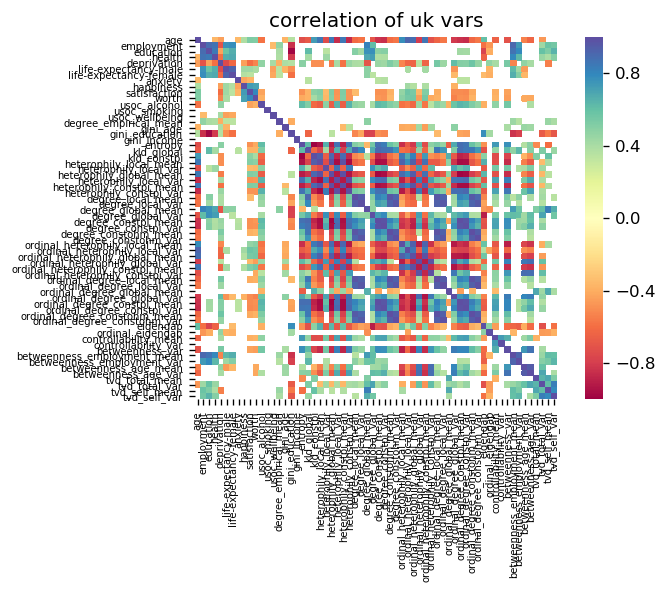

In [1021]:
corrs = corr(data, ignore=[':'])
plot_matrix(corrs['coeff'], corrs['pvalue']>=1e-8, center=0, title='correlation of uk vars', save='figs/')

Here, we have masked non-significant correlations (p-value < `1e-8`). Clearly, health seems to be correlated to some interesting parameters. Let's explore them deeper by doing a correlogram of these variables alone.

In [532]:
def plot_data(df, vars=None, title='', save='', fmt='.pdf', ignore=[':']):
    import seaborn as sns
    import matplotlib.pyplot as plt
    plt.figure(dpi=120)
    if ignore:
        col = [idx for idx in list(df) if any([i in idx for i in ignore])]
        df = df.drop(columns=col)
    ax = sns.pairplot(df, vars=vars, diag_kind='kde')
    if not title:
        if vars is None: title = 'pwcorr'
        else: title = 'pwcorr-'+'-'.join(vars)
    if save: plt.savefig(save+title+fmt, bbox_inches='tight')
    else: plt.show()

<Figure size 720x480 with 0 Axes>

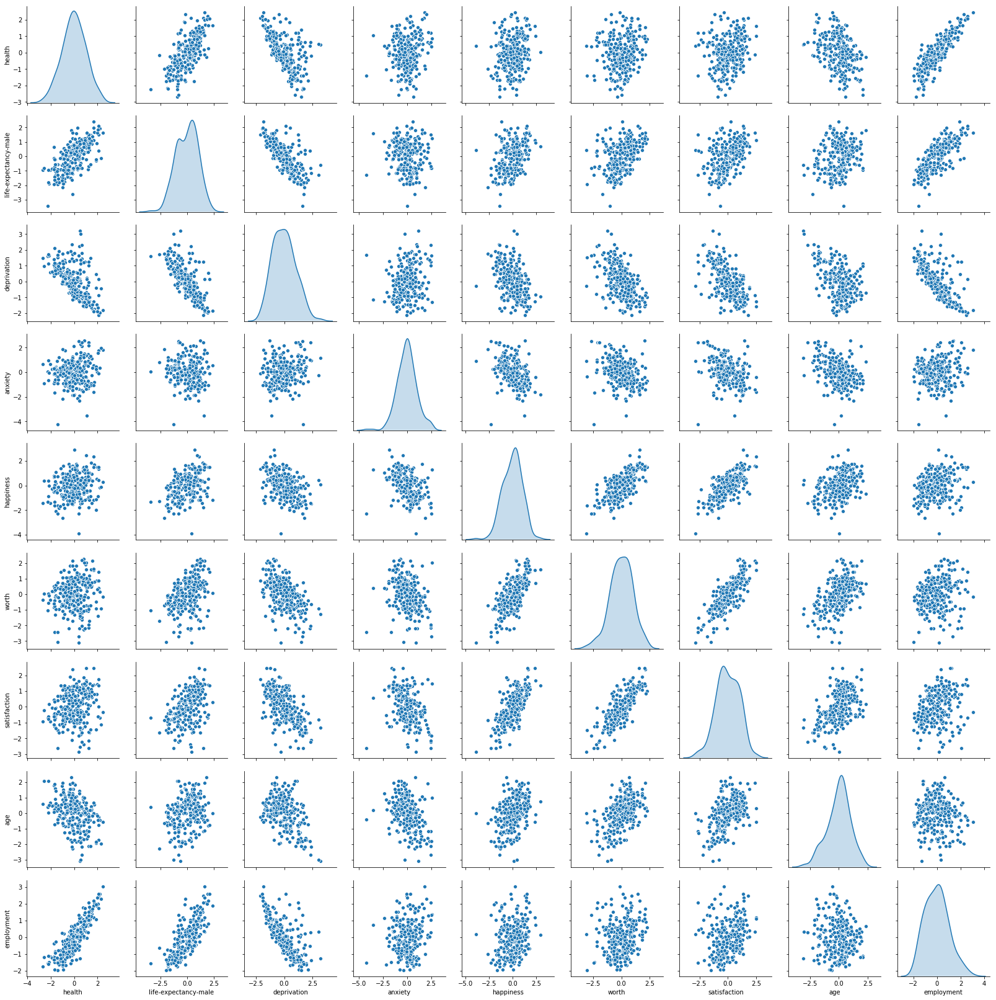

In [548]:
plot_data(data, ['health', 'life-expectancy-male', 'deprivation', 'anxiety', 'happiness', 'worth', 'satisfaction', 'age', 'employment'])

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:448: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:448: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.


<Figure size 720x480 with 0 Axes>

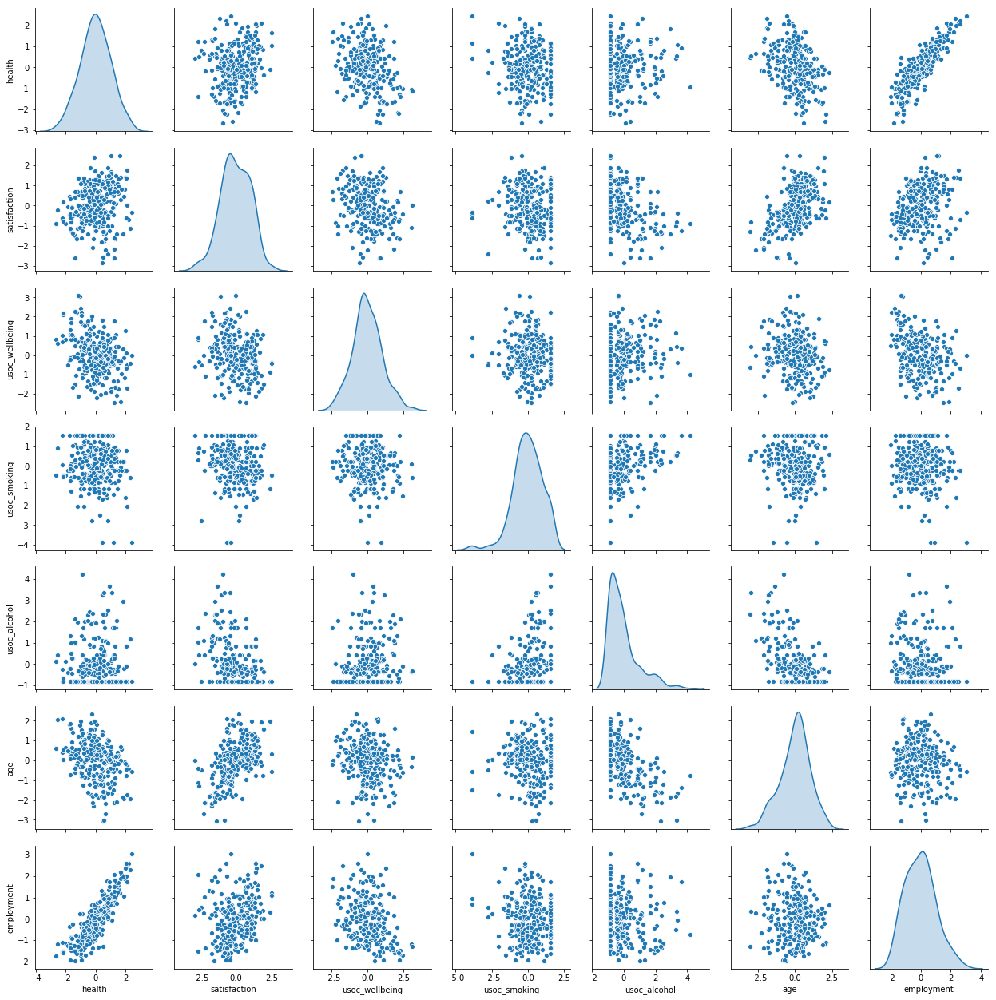

In [555]:
plot_data(data, ['health', 'satisfaction', 'usoc_wellbeing', 'usoc_smoking', 'usoc_alcohol', 'age', 'employment'])

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:448: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:448: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.


<Figure size 720x480 with 0 Axes>

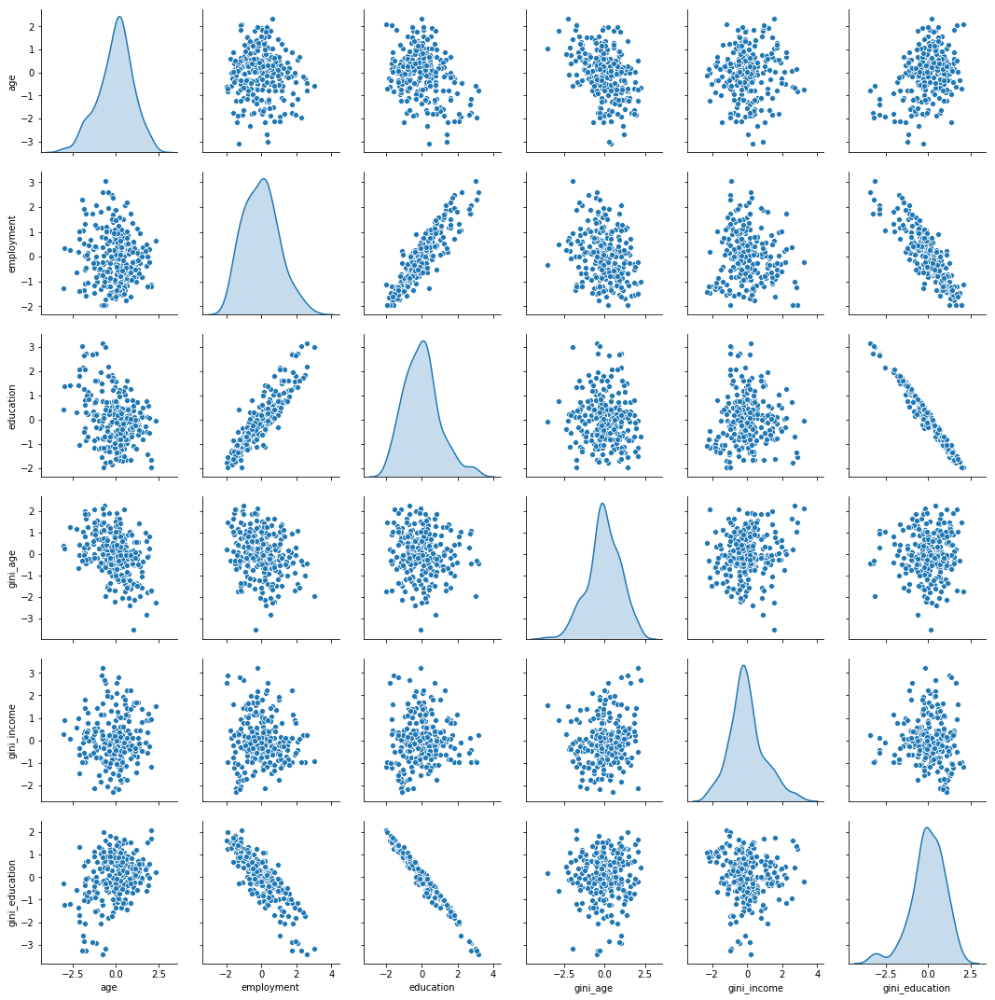

In [523]:
plot_data(data, ['age', 'employment', 'education', 'gini_age', 'gini_income', 'gini_education'])

<Figure size 720x480 with 0 Axes>

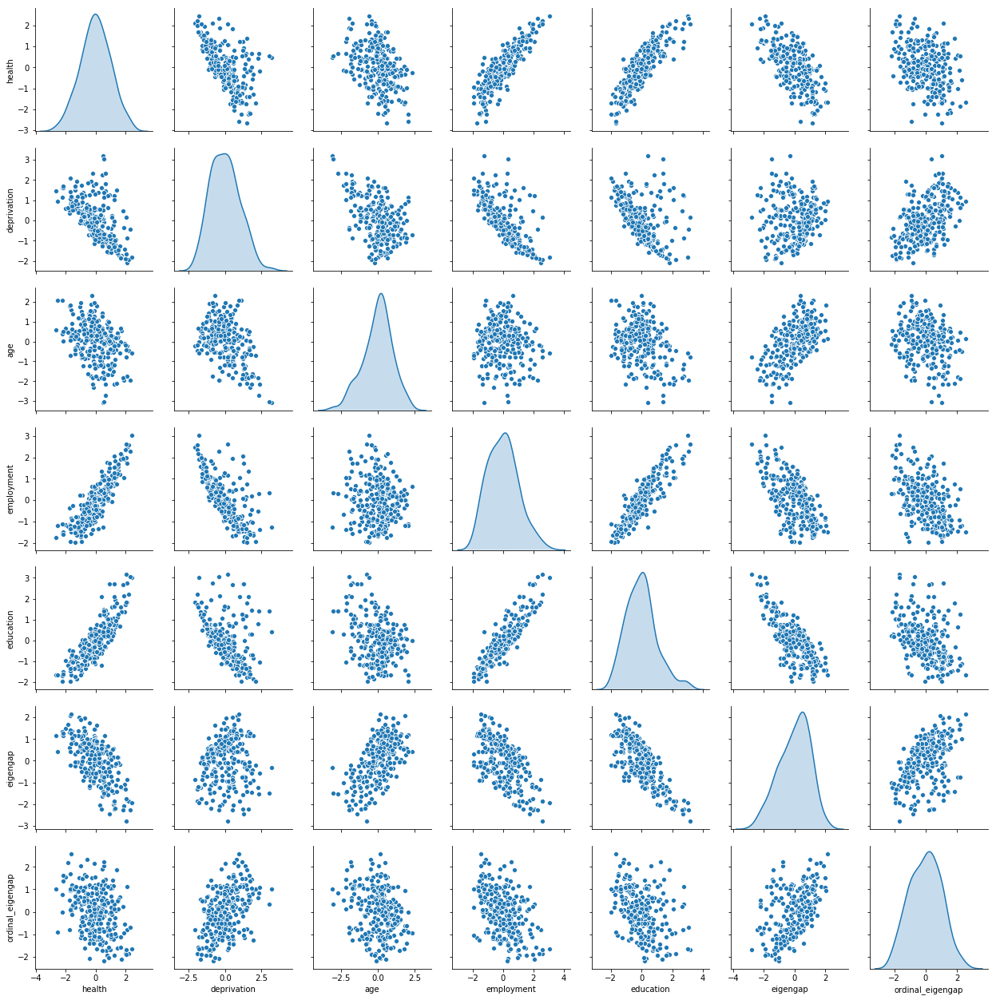

In [525]:
plot_data(data, ['health', 'deprivation', 'age', 'employment', 'education', 'eigengap', 'ordinal_eigengap'])

We note the following:
1. Employment and education behave similarly across the board, and can be treated synonymously is their relationships to other variables.
2. Health is positively correlated to employment (richer/more-educated people are more healthy) and negatively to age (older peoper are less healthy). It is negatively correlated with material deprivation.
3. Deprivation is negatively correlated to both employment and age.
4. Age and employment themselves are uncorrelated.

<Figure size 720x480 with 0 Axes>

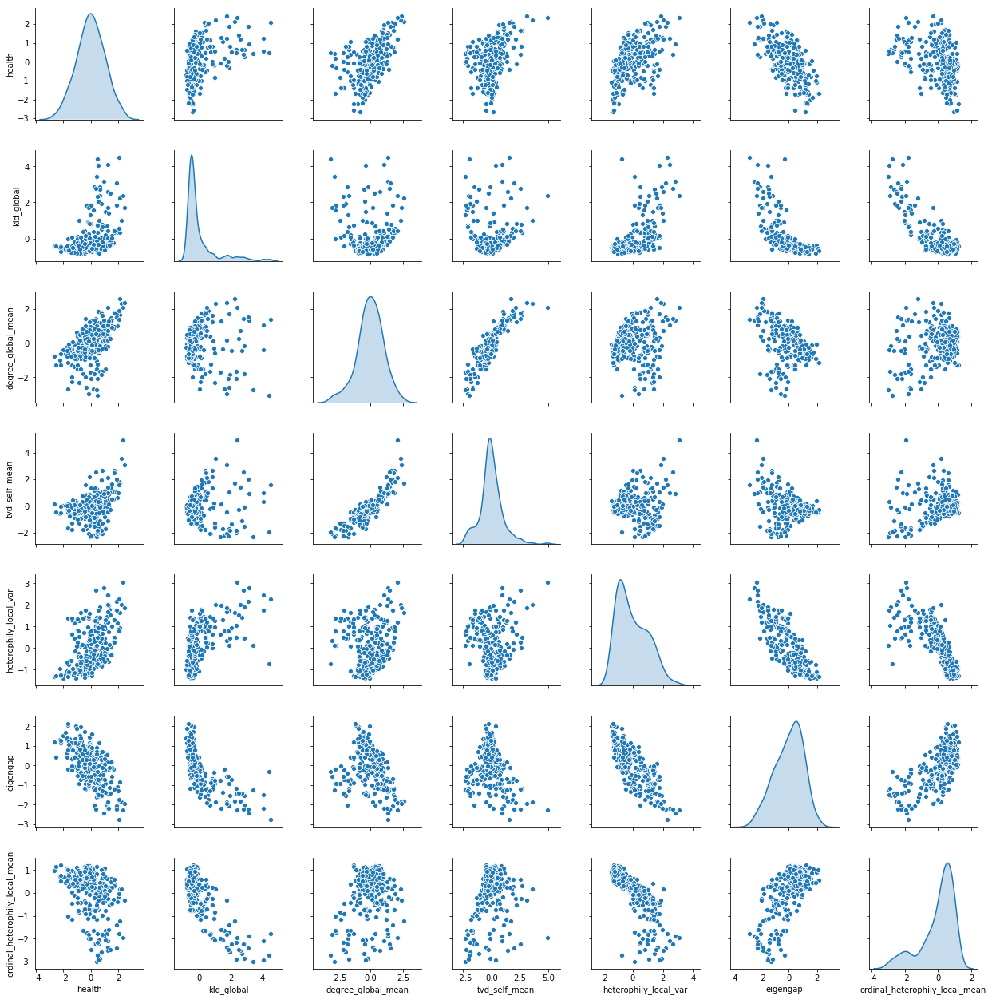

In [329]:
plot_data(data, ['health', 'kld_global','degree_global_mean', 'tvd_self_mean', 'heterophily_local_var', 'eigengap', 'ordinal_heterophily_local_mean'])
#plot_data(data, ['health', 'kld_global','degree_global_mean', 'tvd_self_mean', 'heterophily_local_var', 'eigengap', 'controllability_mean'])

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:448: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:448: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.


<Figure size 720x480 with 0 Axes>

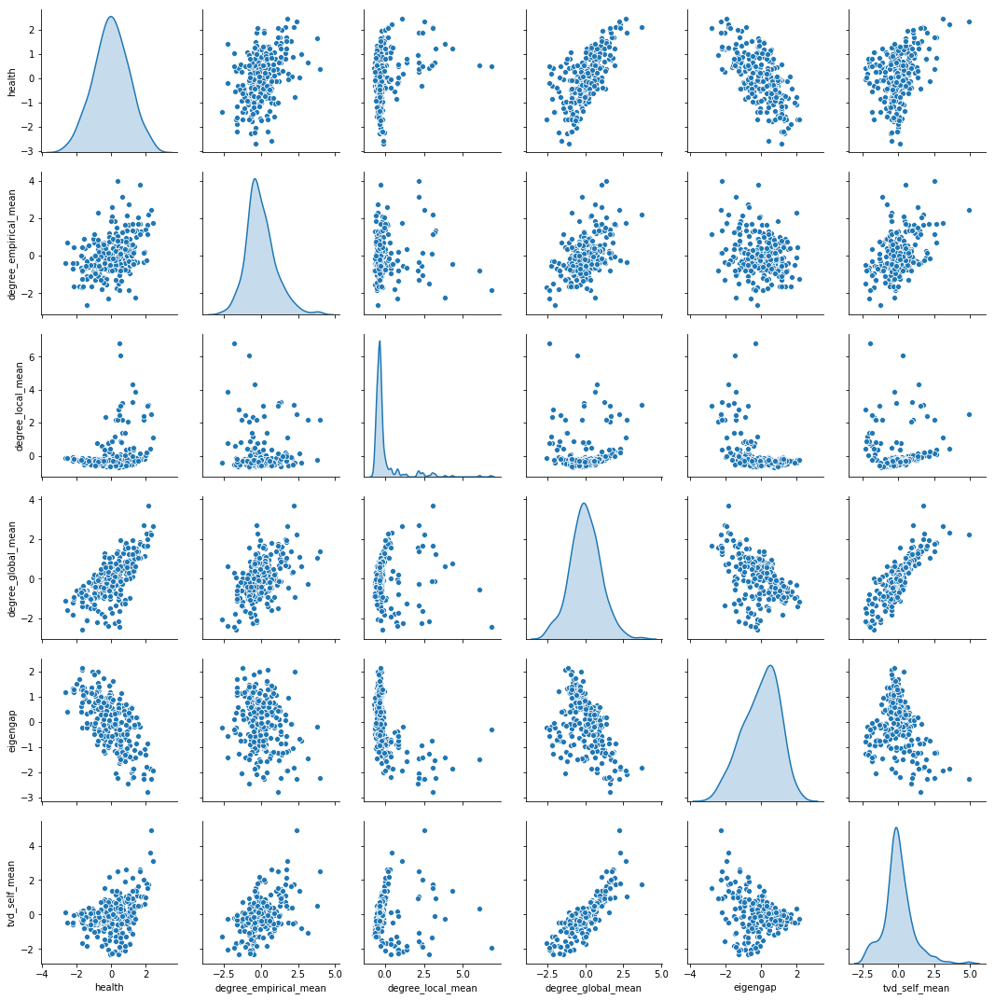

In [533]:
plot_data(data, ['health', 'degree_empirical_mean', 'degree_local_mean', 'degree_global_mean', 'eigengap', 'tvd_self_mean'])

<Figure size 720x480 with 0 Axes>

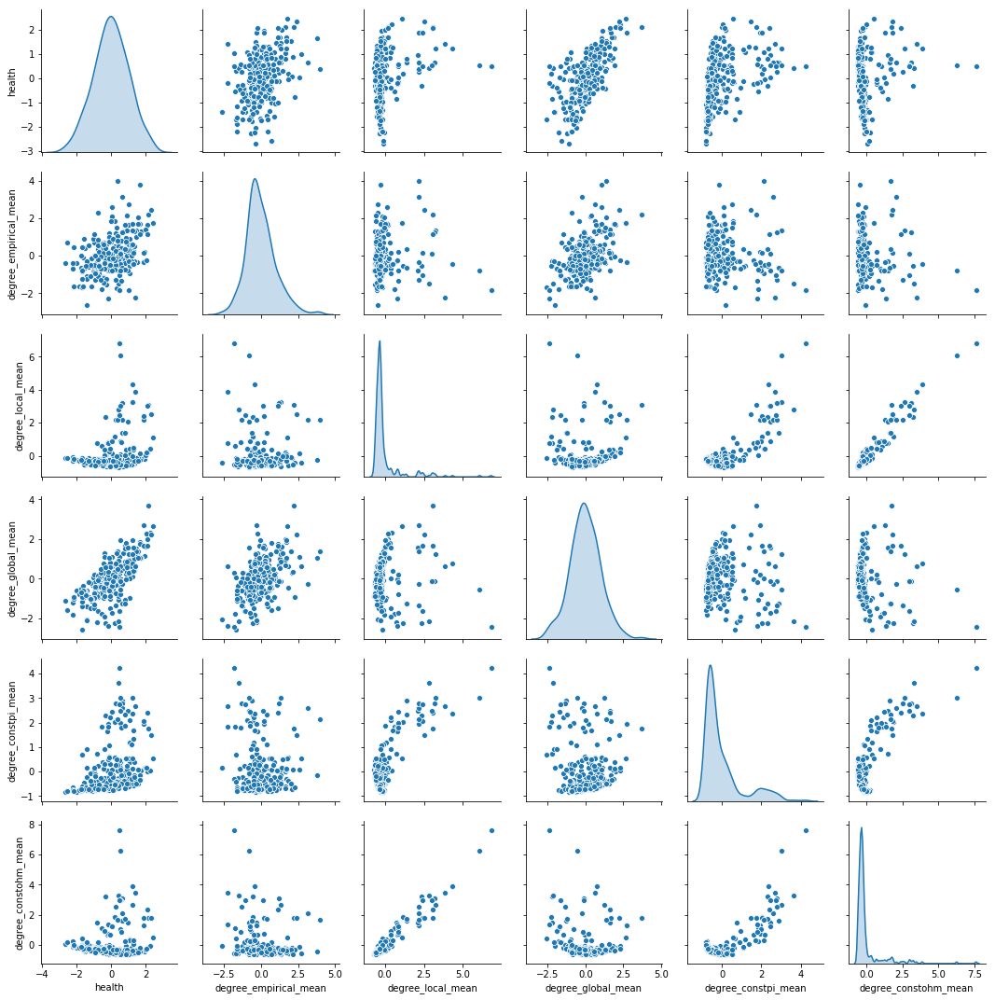

In [534]:
plot_data(data, ['health', 'degree_empirical_mean', 'degree_local_mean', 'degree_global_mean', 'degree_constpi_mean', 'degree_constohm_mean'])

<Figure size 720x480 with 0 Axes>

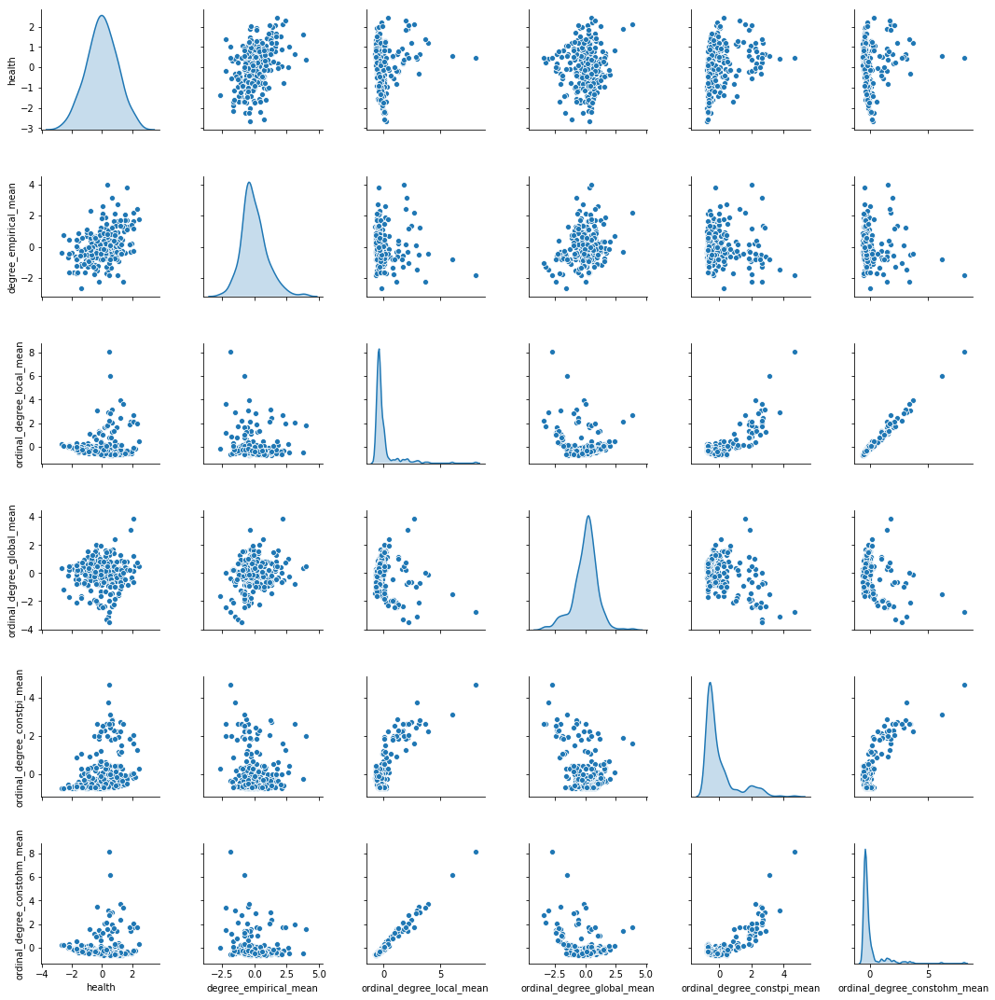

In [535]:
plot_data(data, ['health', 'degree_empirical_mean', 'ordinal_degree_local_mean', 'ordinal_degree_global_mean', 'ordinal_degree_constpi_mean', 'ordinal_degree_constohm_mean'])

We note the following:
1. In terms of purely distribution-based measures, only the KL-divergence from national distribution is significantly (positively) correlated to health.
2. In terms of degrees, only the SBM-inferred `degree_global_mean`, using the national distribution, is significantly (positively) correlated to health. Thus, people with more friends are healthier. Interestingly, this relationship isn't captured as well with the empirically estimated mean number of friends in every borough, using raw USoc and Census data. Perhaps the independence assumption of SBMs is working as a smoothing function to better the estimates of degree.
3. In terms of heterophily, the variance in heterophily measured with regards to the borough distribution is significantly (positively) correlated to health. Thus places with higher variance in heterophily/homophily are healthier. Also, the (self) total variation distance is positively correlated to health, indicating places with higher homophily are healthier. Interestingly, `tvd_self` is strongly positively correlated to `degree_global_mean`, and resembles it in bi-relationships to other variables as well, **indicating that boroughs with higher homophily also have a higher number of friends**.
4. In terms of network centralities, the eigengap is negatively correlated to health and employment-betweenness is positively correlated. For the latter, the explanation goes back to employment correlating to health. But it isn't yet clear why the eigengap, whose larger value indicates more connectivity, should be negatively correlated with health.

Let us do an eigengap-focussed analysis below to understand that measure better.

<Figure size 720x480 with 0 Axes>

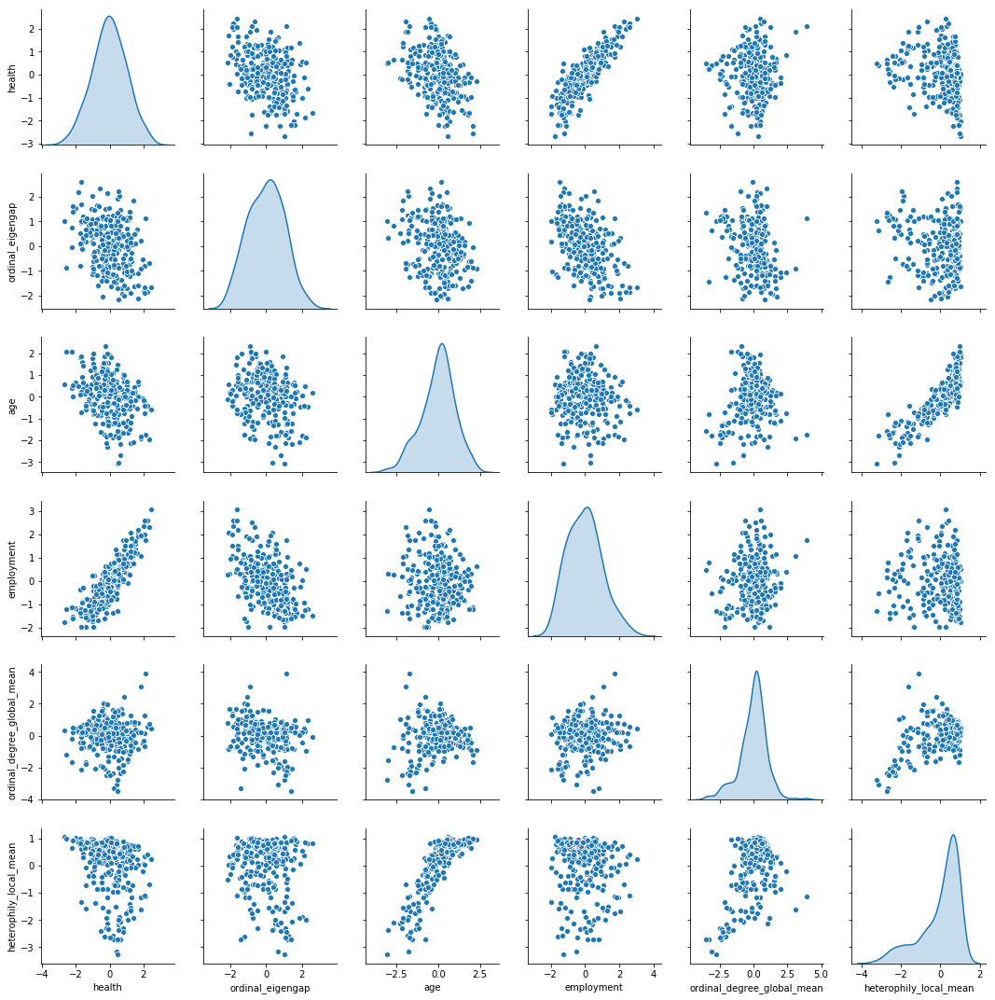

In [510]:
plot_data(data, ['health', 'ordinal_eigengap', 'age', 'employment', 'ordinal_degree_global_mean', 'heterophily_local_mean'])

We note the following:
1. Eigengap is correlated to most other measures. It is positively correlated to age and negatively correlated to employment, which indicates overall connectivity is lower for younger and/or richer boroughs.
2. In terms of other important network measures, the eigengap is negatively correlated to degree and variance in heterophily. Indicating that boroughs where people have more number of friends and/or larger variance in heterophily are actually more poorly connected on the whole. This echoes the negative relationship between `tvd_self` and `degree_global_mean` we noted earlier.

In order to obtain a deeper understanding of the eigengap-health story, we must generate suitable multivariate models.

In [1095]:
def analyze(model, verbose=True, short=False):
    import pandas as pd
    coef = model.params
    errs = model.bse
    del coef['Intercept']
    del errs['Intercept']
    norm = coef.abs().sum()
    coef /= norm
    errs /= norm
    coef = pd.concat([coef, errs], axis=1)
    coef.columns = ['coef', 'serr']
    model_atts = dir(model)
    if verbose:
        if 'rsquared' in model_atts: print('R2: %.2f, condition number: %.2f'%(model.rsquared, model.condition_number))
        if 'llf' in model_atts: print('log-likelihood: %.2f'%(model.llf))
        print('==============================')
        print(coef)
        print('==============================')
    if short is not None and 'rsquared' in model_atts:
        if short:
            fig = plt.figure(figsize=(12, 8))
            sm.graphics.plot_partregress_grid(model, fig=fig, exog_idx=[i for i in range(1, len(coef)+1)])
            plt.show()
        else:
            for key in coef.index:
                fig = plt.figure(figsize=(12,8))
                sm.graphics.plot_regress_exog(model, key, fig=fig)
                plt.show()
    if 'rsquared' in model_atts: return {'coef':coef, 'r2':model.rsquared, 'cond':model.condition_number}
    elif 'llf' in model_atts: return {'coef':coef, 'll':model.llf}

Let us perform a multivariate OLS of `eigengap` from `employment`, `age`, `degree_global_mean` and `heterophily_local_var`.

R2: 0.82, condition number: 7.34
                              coef      serr
employment               -0.065594  0.025095
age                      -0.072232  0.027277
degree_global_mean       -0.239397  0.027025
heterophily_local_var[0]  0.112763  0.029054
heterophily_local_var[1] -0.510014  0.042355


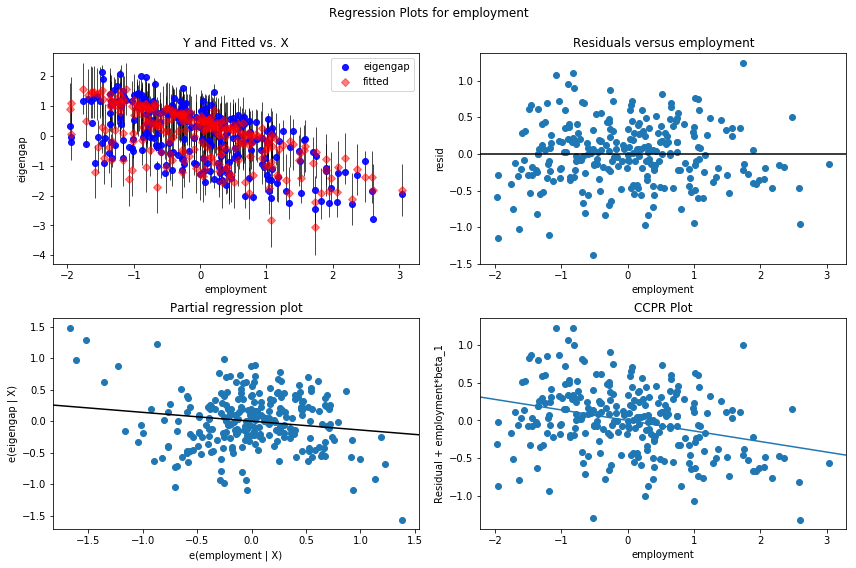

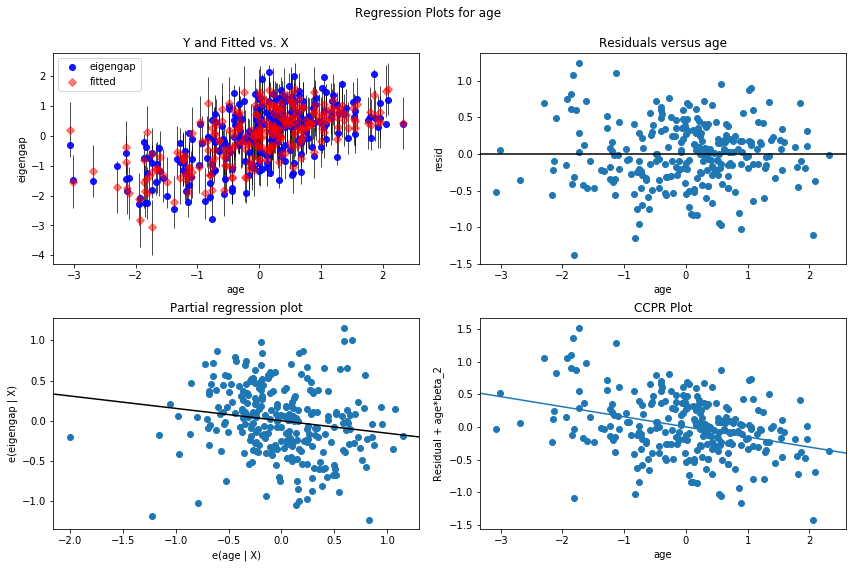

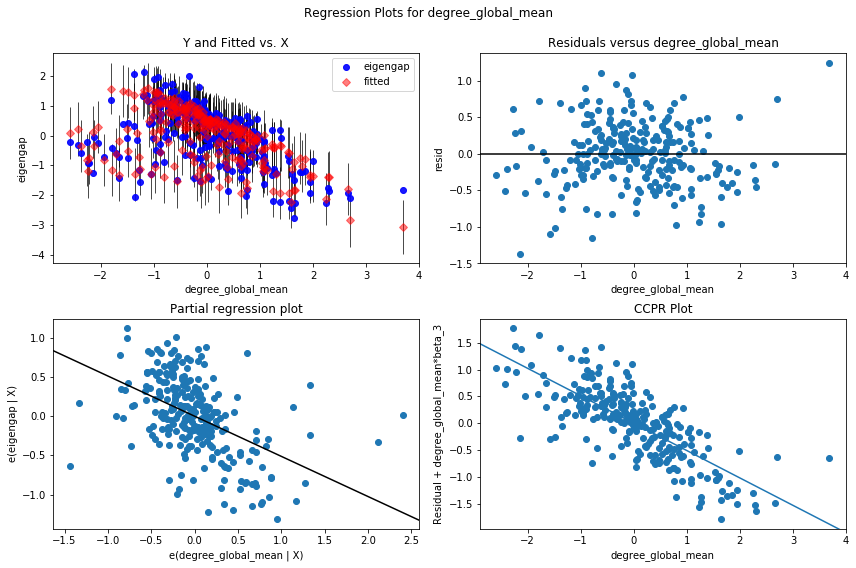

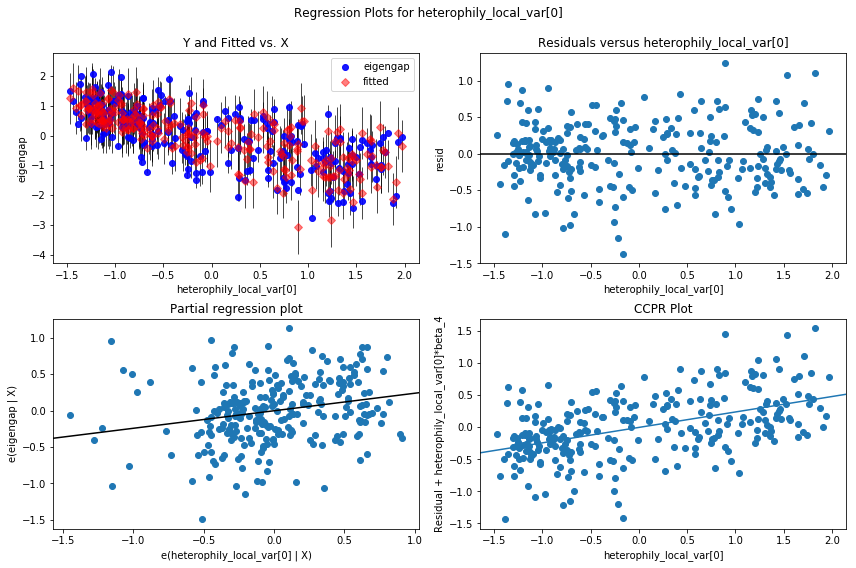

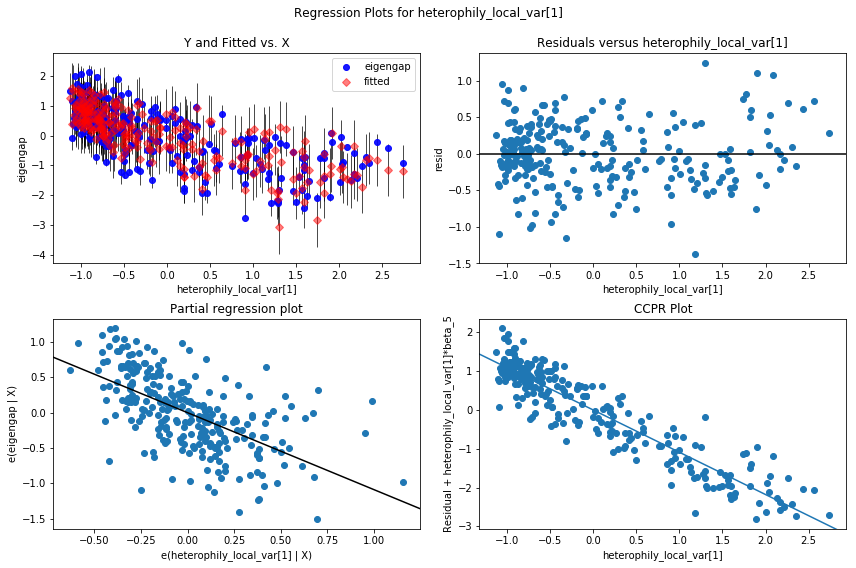

In [511]:
model = ols('eigengap ~ employment + age + degree_global_mean + heterophily_local_var', data=data).fit()
res = analyze(model)

R2: 0.85, condition number: 9.37
                                      coef      serr
ordinal_degree_global_mean        0.012428  0.015481
ordinal_heterophily_local_var[0]  0.146694  0.050564
ordinal_heterophily_local_var[1] -0.020479  0.028648
employment                        0.478046  0.019676
age                              -0.342353  0.064072


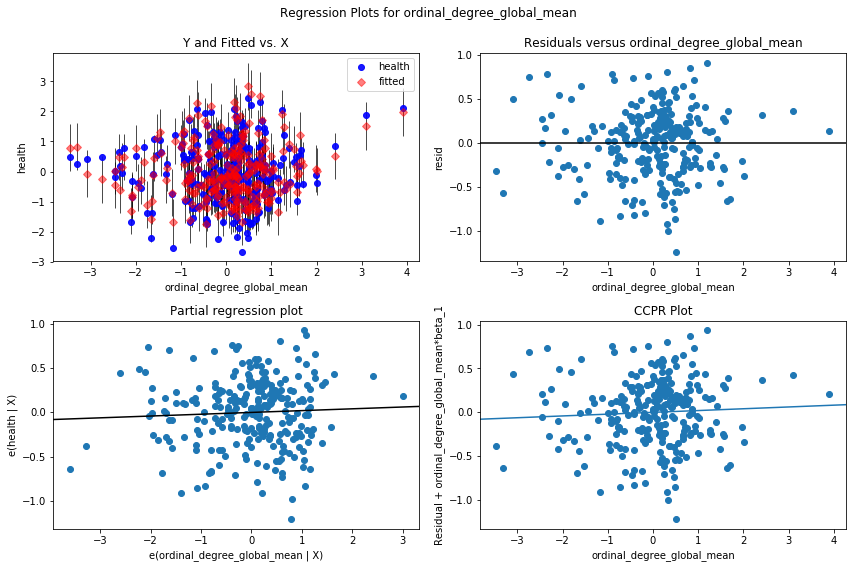

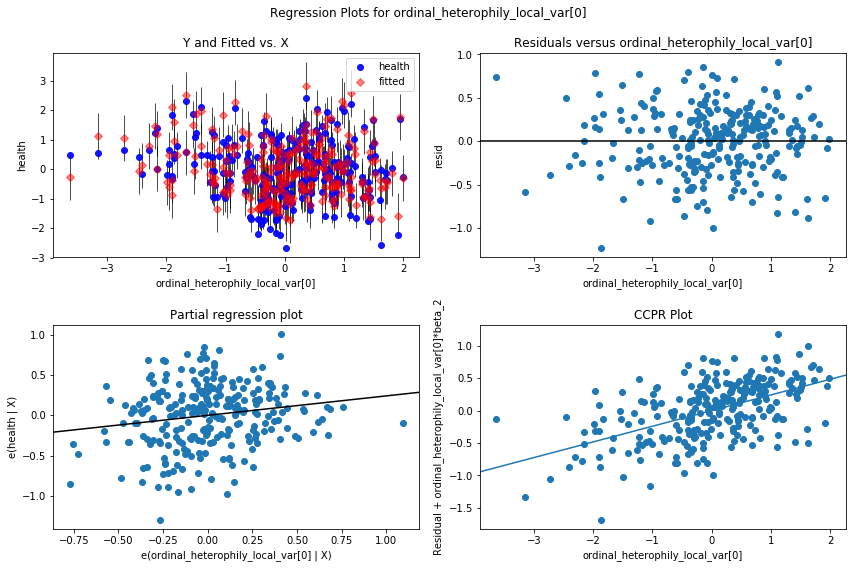

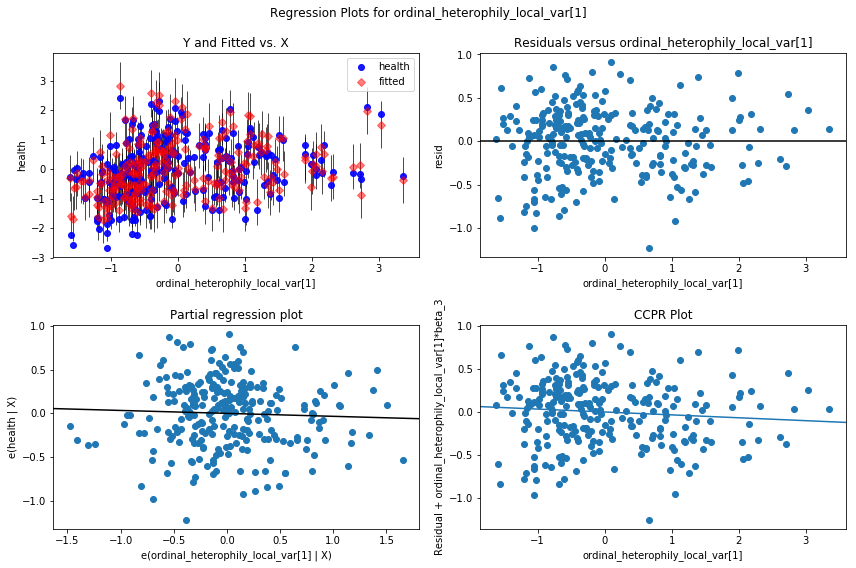

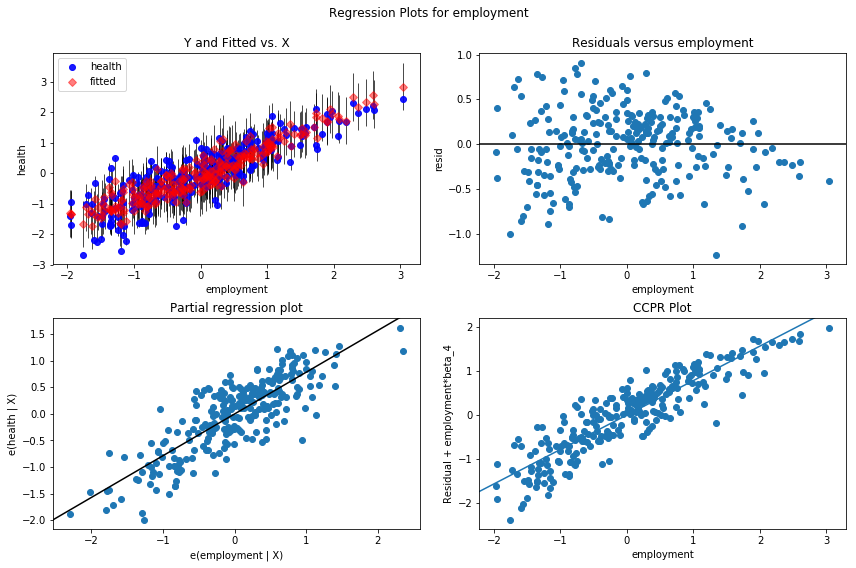

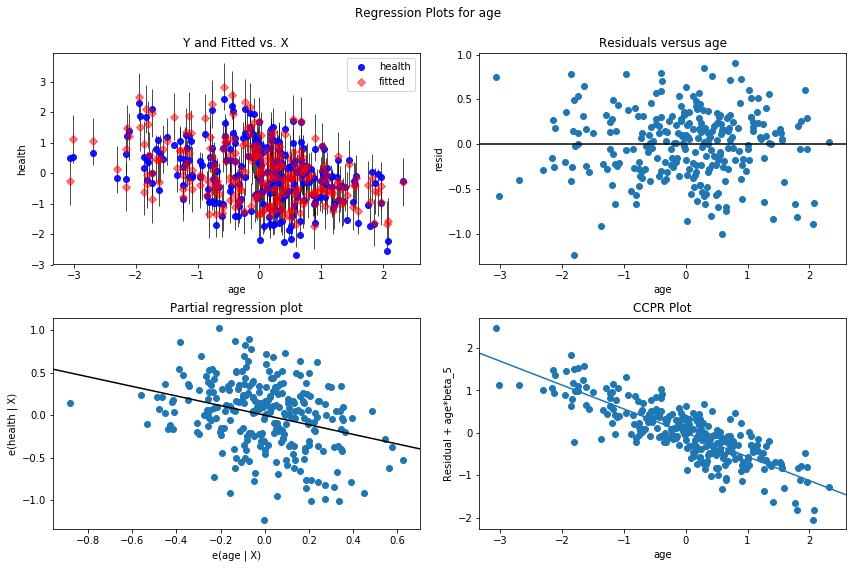

In [514]:
model = ols('health ~ ordinal_degree_global_mean + ordinal_heterophily_local_var + employment + age', data=data).fit()
res = analyze(model)

R2: 0.86, condition number: 5.62
                            coef      serr
degree_global_mean     -0.123171  0.026395
heterophily_local_mean  0.132987  0.029681
employment              0.506790  0.021736
age                    -0.237052  0.023844


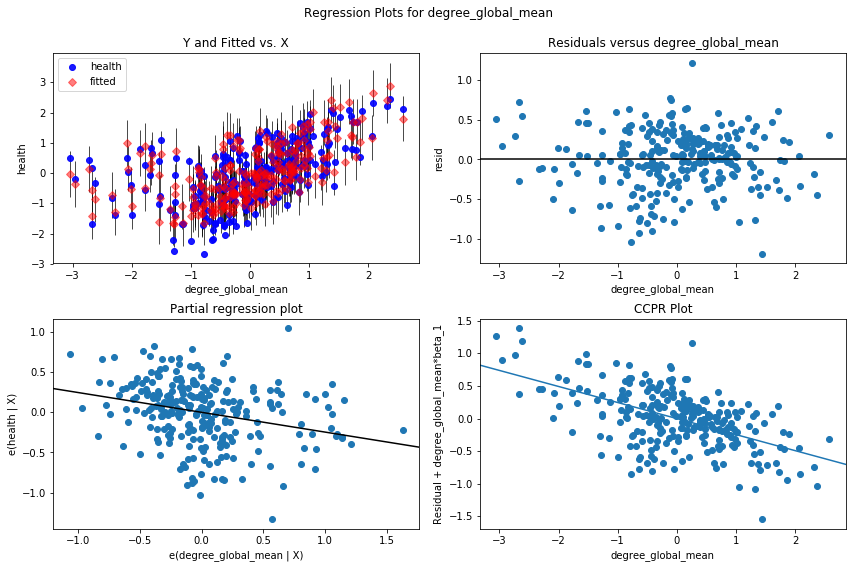

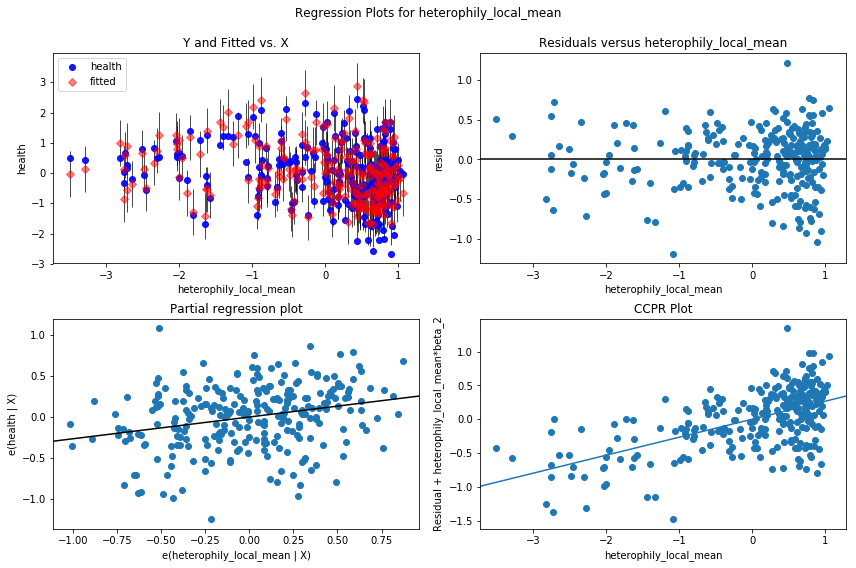

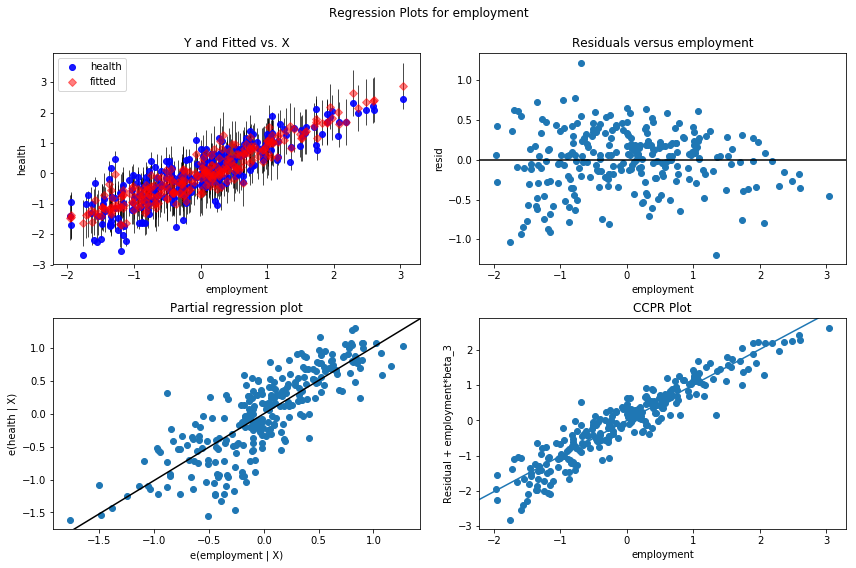

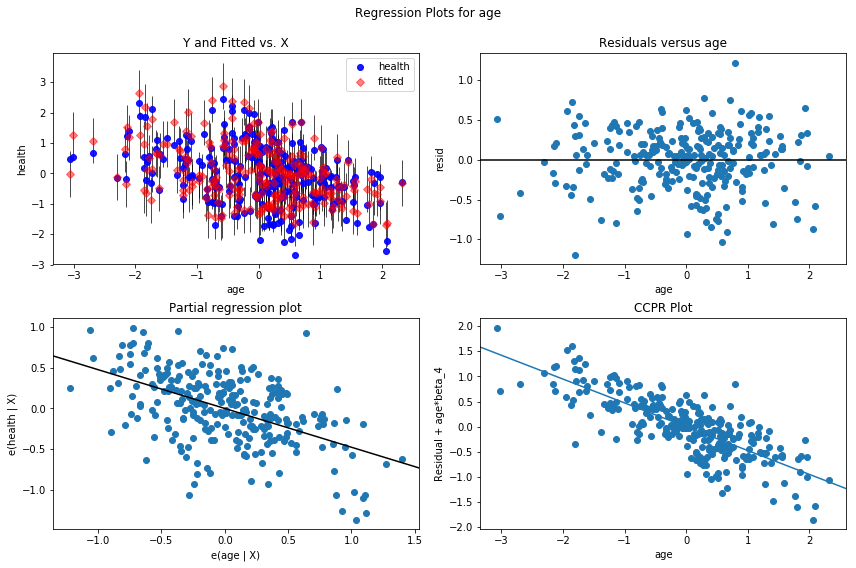

In [389]:
model = ols('health ~ degree_global_mean + heterophily_local_mean + employment + age', data=data).fit()
res = analyze(model)

After performing a multivariate analysis, we note that 83% of variance in eigengap is explained. Heterophily contributes the most, followed by employment, age, and degree has a very small contribution. Indeed, if we perform a multistep MV analysis where we gradually add predictors, we note that degree doesn't explain added variation.

In [1104]:
def models(df, y, x, binary=False, n=float('inf'), verbose=False, short=None, plot=True, single=True, save='', fmt='.pdf'):
    from itertools import combinations as combi
    if isinstance(y, str): y = [y]
    if isinstance(x, str): x = [x]
    models = dict()
    coeffs = dict()
    for tgt in y:
        models[tgt] = []
        coeffs[tgt] = {i: [] for i in x}
        for i in range(1, min(len(x),n)+1):
            models[tgt].append(dict())
            srcs = [' + '.join(src) for src in combi(x, i)]
            for src in srcs:
                model_name = tgt + ' ~ ' + src
                if binary: model = glm(model_name, data=df, family=sm.families.Binomial()).fit()
                else: model = ols(model_name, data=df).fit()
                if verbose: print('MODEL:', model_name)
                tmp = analyze(model, verbose=verbose, short=short)
                models[tgt][i-1][src] = tmp
                if binary:
                    for j in tmp['coef'].index: coeffs[tgt][j].append((i, tmp['coef']['coef'][j], tmp['coef']['serr'][j], tmp['ll']))
                else:
                    for j in tmp['coef'].index: coeffs[tgt][j].append((i, tmp['coef']['coef'][j], tmp['coef']['serr'][j], tmp['r2']))
                if verbose: print('\n')
        if plot:
            plt.figure(dpi=120)
            idx = 0.5
            x_max = 0
            y_max = -float('inf')
            y_min = float('inf')
            for key in coeffs[tgt]:
                x_toplot = [i[0] for i in coeffs[tgt][key]]
                x_max = int(max(x_max, max(x_toplot)))
                x_toplot = [i-0.25 + 0.5*idx/x_max for i in x_toplot]
                y_toplot = [i[-1] for i in coeffs[tgt][key]]
                y_max = max(y_max, max(y_toplot))
                y_min = min(y_min, min(y_toplot))
                idx += 1
                plt.scatter(x_toplot, y_toplot, label=key, marker='+')
            plt.legend(bbox_to_anchor=(1.02,1.0), loc='upper left')
            plt.title(tgt)
            plt.xlabel('number of predictors')
            if binary: plt.ylabel('log-likelihood')
            else: plt.ylabel('$R^2$')
            for i in range(x_max): plt.gca().axvline(i+0.5, ls='-', c='gray', alpha=0.2)
            plt.gca().axvline(x_max+0.5, ls='-', c='gray', alpha=0.2)
            if save:
                if binary: plt.savefig(save+'/glm-'+tgt+'-vs-'+'-'.join(coeffs[tgt].keys())+'-ll'+fmt, bbox_inches='tight')
                else: plt.savefig(save+'/ols-'+tgt+'-vs-'+'-'.join(coeffs[tgt].keys())+'-r2'+fmt, bbox_inches='tight')
            plt.show()
            if single:
                plt.figure(dpi=120)
                for key in coeffs[tgt]:
                    x_toplot = [i[0] for i in coeffs[tgt][key]]
                    if binary: x_errs = [(i[-1]-y_min)/(2*(y_max-y_min)) for i in coeffs[tgt][key]]
                    else: x_errs = [i[-1]/2 for i in coeffs[tgt][key]]
                    y_toplot = [i[1] for i in coeffs[tgt][key]]
                    y_errs = [i[2] for i in coeffs[tgt][key]]
                    plt.errorbar(x_toplot, y_toplot, xerr=x_errs, yerr=y_errs, label=key, fmt='o')
                plt.legend(bbox_to_anchor=(1.02,1.0), loc='upper left')
                plt.title(tgt)
                if binary: plt.xlabel('number of predictors (bar: ll (normed))')
                else: plt.xlabel('number of predictors (bar: $R^2$)')
                plt.ylabel('normalized coefficient (bar: $\sigma_\\beta$)')
                for i in range(x_max):
                    plt.gca().axhline(1/(i+1), ls=':', c='black', alpha=1/(i+1))
                    plt.gca().axhline(-1/(i+1), ls=':', c='black', alpha=1/(i+1))
                    plt.gca().axvline(i+0.5, ls='-', c='gray', alpha=0.2)            
                plt.gca().axhline(0, ls='-', c='gray', alpha=0.2)
                plt.gca().axvline(x_max+0.5, ls='-', c='gray', alpha=0.2)
                if save:
                    if binary: plt.savefig(save+'/glm-'+tgt+'-vs-'+'-'.join(coeffs[tgt].keys())+fmt, bbox_inches='tight')
                    else: plt.savefig(save+'/ols-'+tgt+'-vs-'+'-'.join(coeffs[tgt].keys())+fmt, bbox_inches='tight')
                plt.show()
            else:
                for key in coeffs[tgt]:
                    plt.figure(dpi=120)
                    x_toplot = [i[0] for i in coeffs[tgt][key]]
                    if binary: x_errs = [(i[-1]-y_min)/(2*(y_max-y_min)) for i in coeffs[tgt][key]]
                    else: x_errs = [i[-1]/2 for i in coeffs[tgt][key]]
                    y_toplot = [i[1] for i in coeffs[tgt][key]]
                    y_errs = [i[2] for i in coeffs[tgt][key]]
                    plt.errorbar(x_toplot, y_toplot, xerr=x_errs, yerr=y_errs, label=key, fmt='o')
                    plt.title(tgt+'-vs-'+key)
                    if binary: plt.xlabel('number of predictors (bar: ll (normed))')
                    else: plt.xlabel('number of predictors (bar: $R^2$)')
                    plt.ylabel('normalized coefficient (bar: $\sigma_\\beta$)')
                    for i in range(x_max):
                        plt.gca().axhline(1/(i+1), ls=':', c='black', alpha=1/(i+1))
                        plt.gca().axhline(-1/(i+1), ls=':', c='black', alpha=1/(i+1))
                        plt.gca().axvline(i+0.5, ls='-', c='gray', alpha=0.2)            
                    plt.gca().axhline(0, ls='-', c='gray', alpha=0.2)
                    plt.gca().axvline(x_max+0.5, ls='-', c='gray', alpha=0.2)
                    if save:
                        if binary: plt.savefig(save+'/glm-'+tgt+'-vs-'+key+'-given-'+'-'.join(coeffs[tgt].keys()-key)+fmt, bbox_inches='tight')
                        else: plt.savefig(save+'/ols-'+tgt+'-vs-'+key+'-given-'+'-'.join(coeffs[tgt].keys()-key)+fmt, bbox_inches='tight')
                    plt.show()
    return models

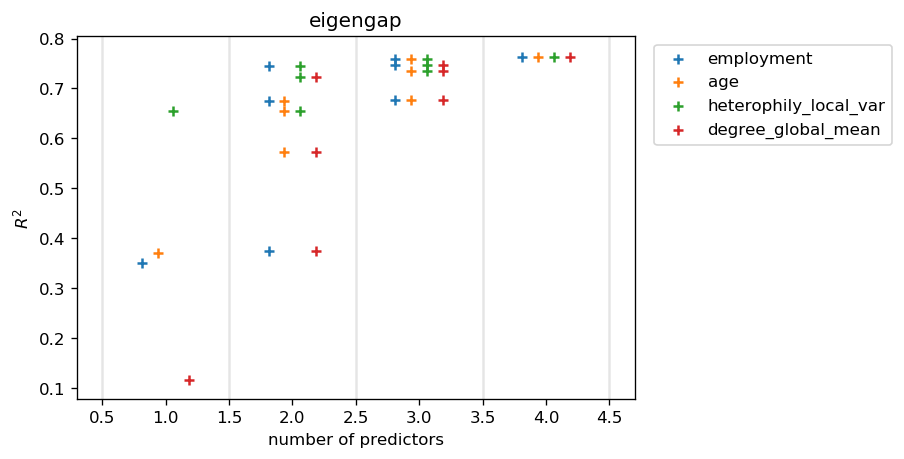

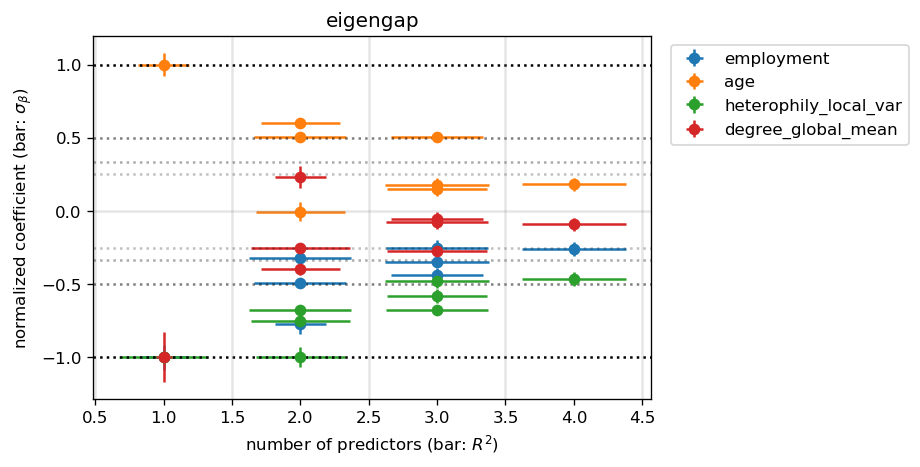

In [275]:
models_eig = models(data, 'eigengap', ['employment', 'age', 'heterophily_local_var', 'degree_global_mean'])

The first plot shows the $R^2$ value of different predictor combinations, as more predictors are added. Clearly, heterophily explains the largest variance in eigengap, followed by employment and age.

Let's see how this affects predictions of health.

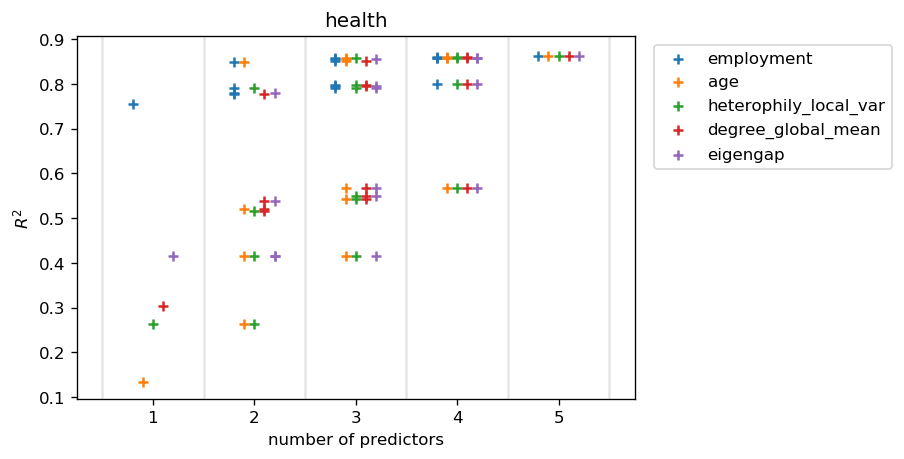

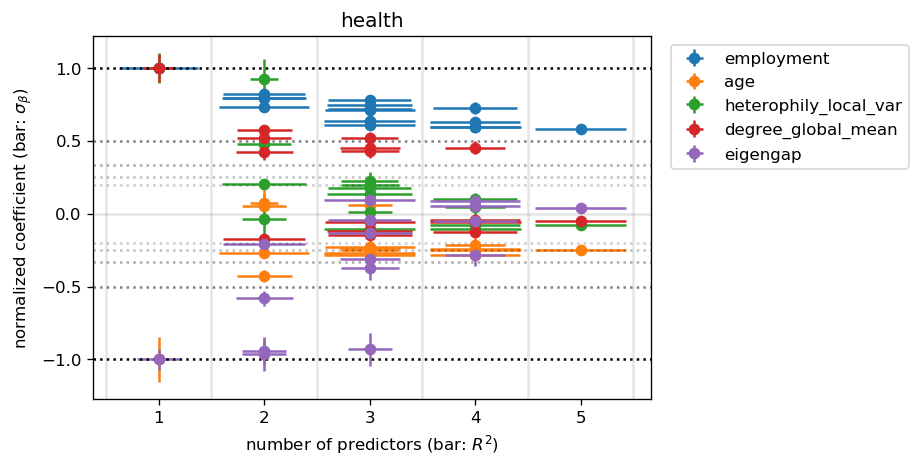

In [276]:
models_health = models(data, 'health', ['employment', 'age', 'heterophily_local_var', 'degree_global_mean', 'eigengap'])

We note the following:
1. As individual predictors, employment is the best predictor, followed by eigengap, degree and heterophily. Age, surprisingly, explains the least variation (12%).
2. For pairwise predictors, employment and age together explain the highest variation. This highlights the orthogonality of age and employment, in terms of explaining the variance of health. This pair is followed close behind by a pair of employment and one of the network measures. The highest ranking non-employment pair is eigengap and degree, explaining around 54% of the variance.
3. Looking at 3, 4 and 5 combinations, it becomes clear that in combination with employment and age, any of the three remaining network measures can be used to explain the remaining variance.

Given the third point, we now consider only `eigengap` as the network measure.

R2: 0.86, condition number: 3.19
                coef      serr
employment  0.636867  0.022588
age        -0.266705  0.022922
eigengap    0.096428  0.028394


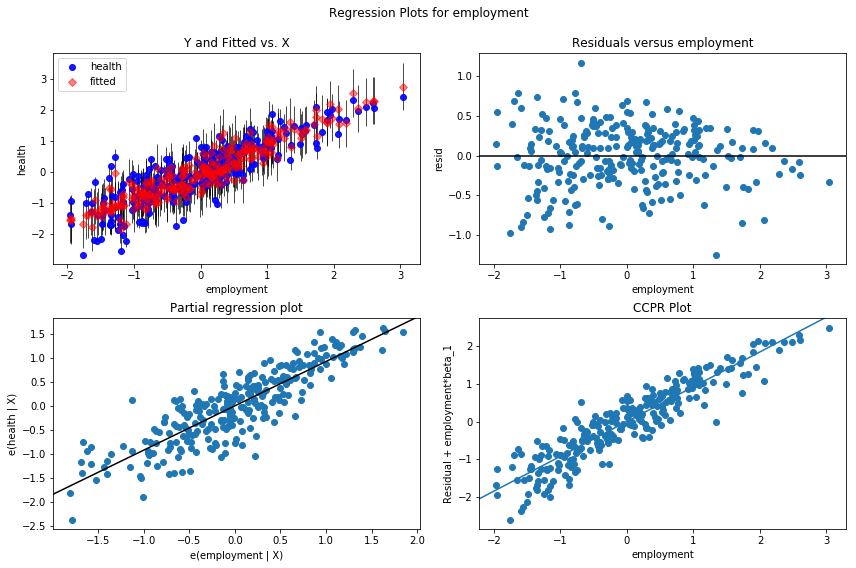

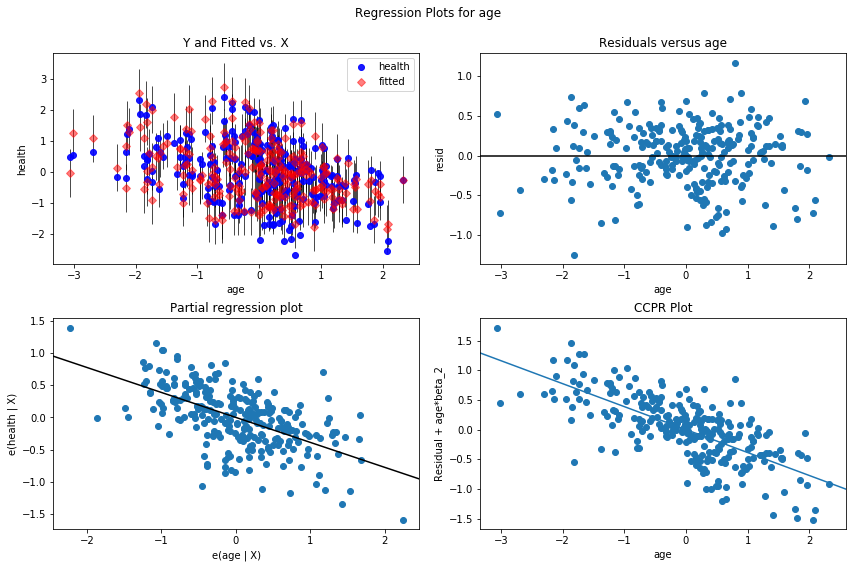

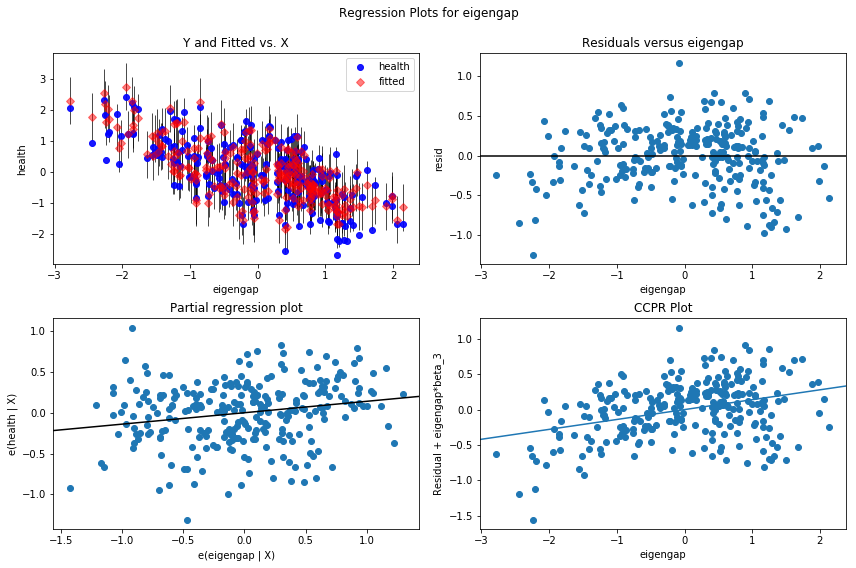

In [279]:
model_health = ols('health ~ employment + age + eigengap', data=data).fit()
res = analyze(model_health)

R2: 0.68, condition number: 1.24
                                coef      serr
employment                  0.119723  0.030452
age                         0.581171  0.030692
ordinal_degree_global_mean  0.299107  0.030798


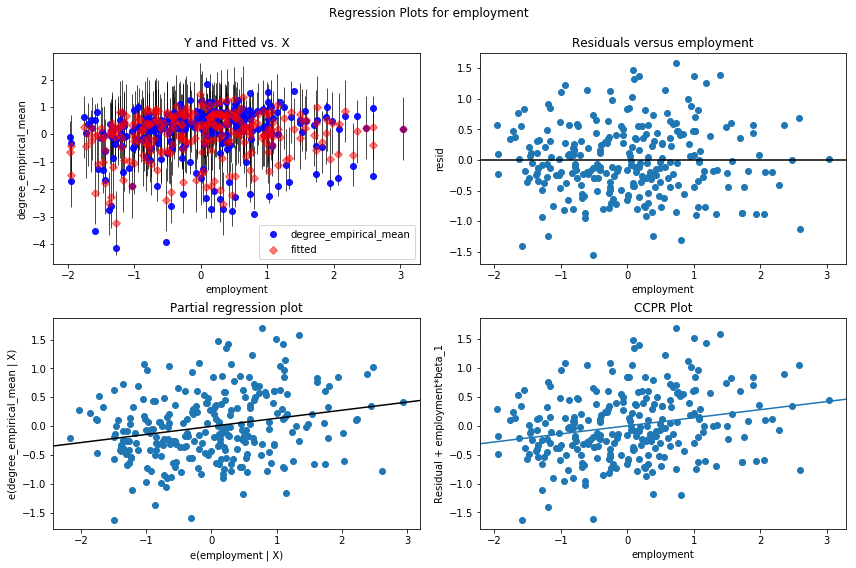

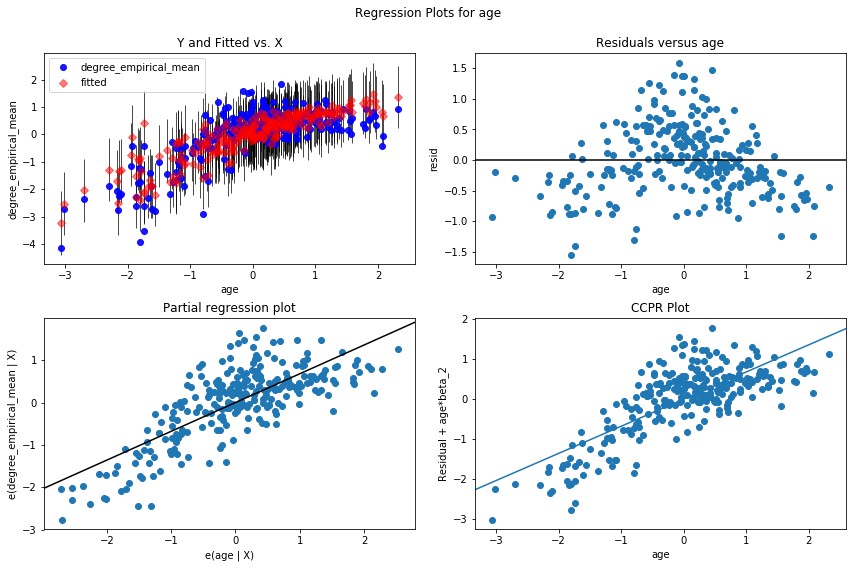

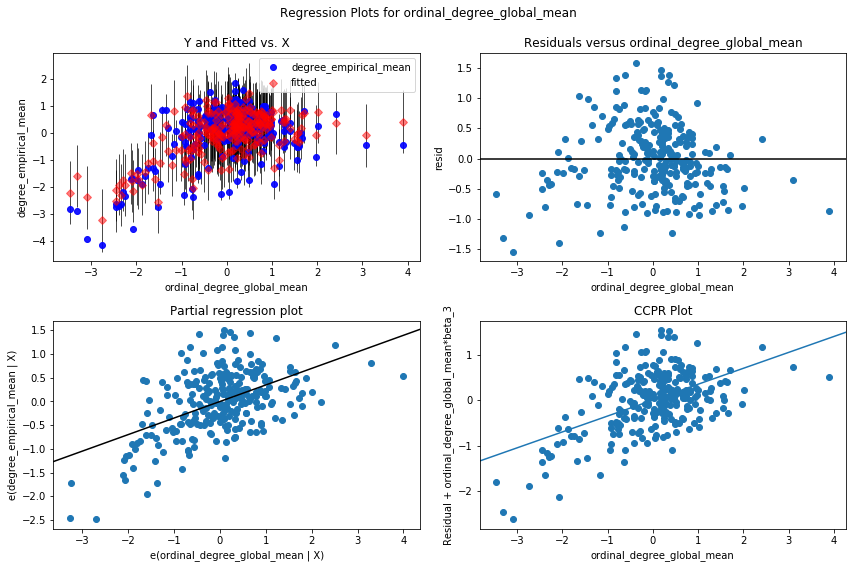

In [466]:
model_degree = ols('degree_empirical_mean ~  employment + age + ordinal_degree_global_mean', data=data).fit()
res = analyze(model_degree)

R2: 0.66, condition number: 1.46
                    coef      serr
age            -0.105579  0.044537
gini_education -0.894421  0.045008


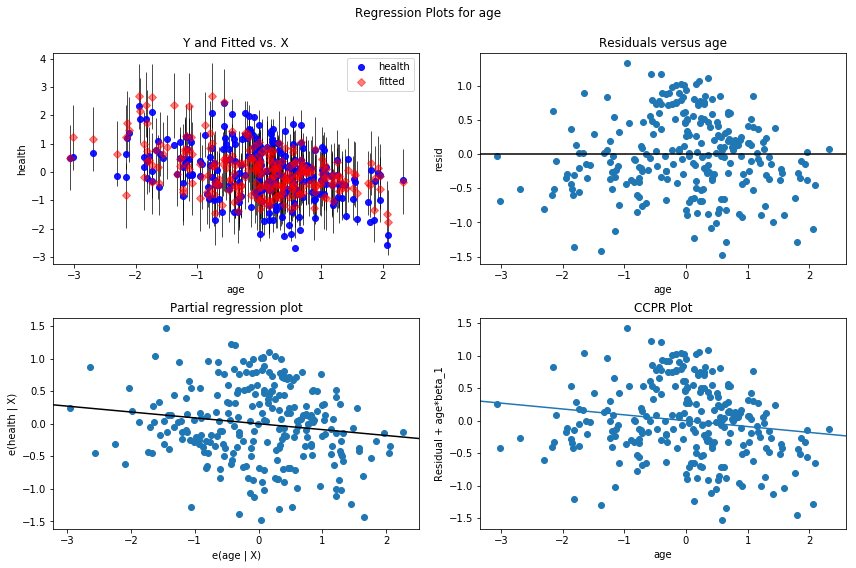

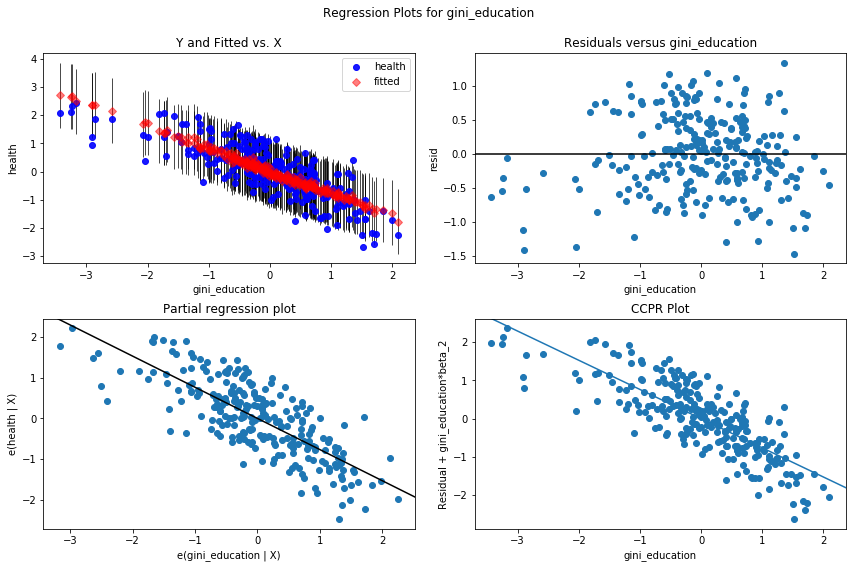

In [482]:
model_health = ols('health ~ age + gini_education', data=data).fit()
res = analyze(model_health)

Interestingly, after controlling for age and income, eigengap now has a (small) positive contribution to health. **This indicates that for a given income and age, more connectivity correlates positively to health.**

We can also study the relationship to other health outcomes in our dataset.

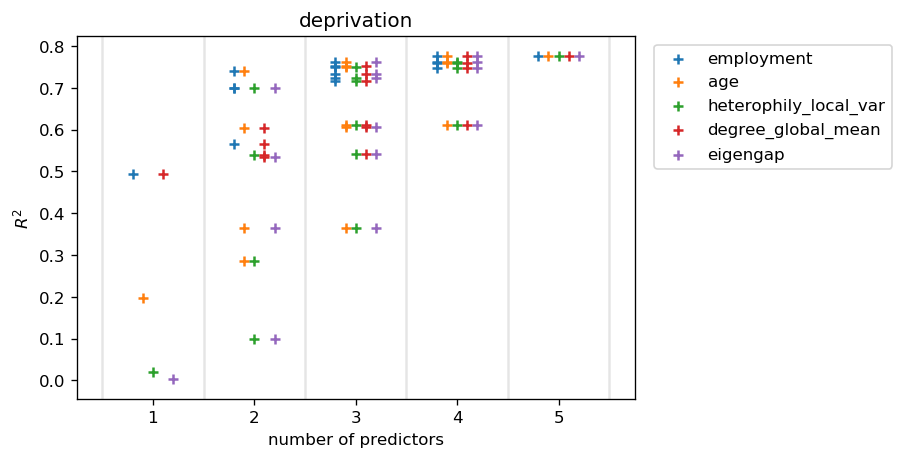

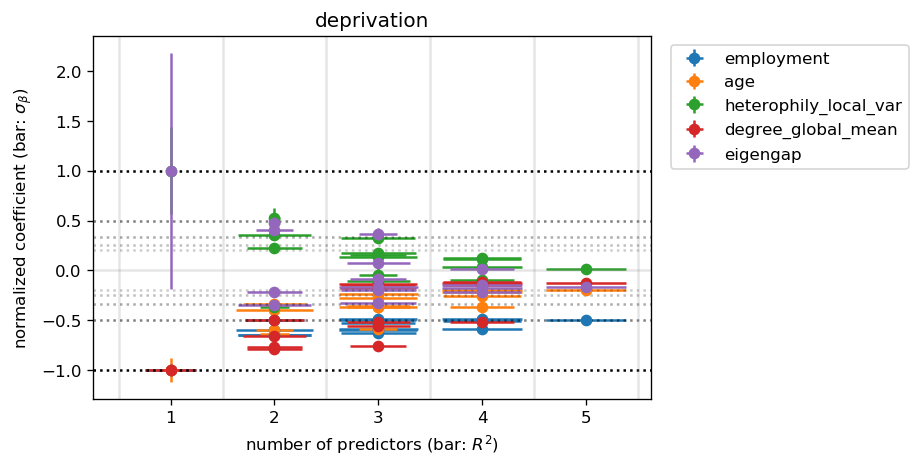

In [287]:
models_deprivation = models(data, 'deprivation', ['employment', 'age', 'heterophily_local_var', 'degree_global_mean', 'eigengap'])

We note the following:
1. By itself, eigengap or heterophily explain almost none of the variation in deprivation. Employment and degree explain the most (~50%), followed by age (~20%).
2. However, for pairs of predictors, the eigengap adds on to the variation explained by employment almost as much as age does.
3. After controlling for income and age, eigengap negatively contributes to deprivation. Thus more connectivity implies lesser deprivation. This is echoed by the stronger relationship to variance in heterophily; which works slightly better than age in predicting deprivation (alone and alongside employment), and after controlling for both contributes positively to it.
4. Degree contributes negatively to deprivation all throughout, indicating that more number of friends implies less material deprivation.

R2: 0.75, condition number: 2.84
                        coef      serr
employment         -0.489103  0.039181
age                -0.370223  0.026469
degree_global_mean -0.140674  0.039654


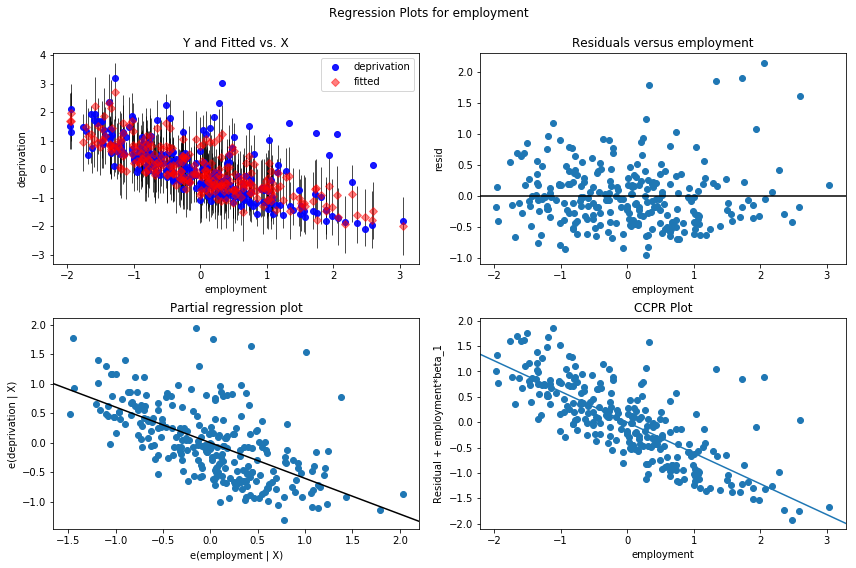

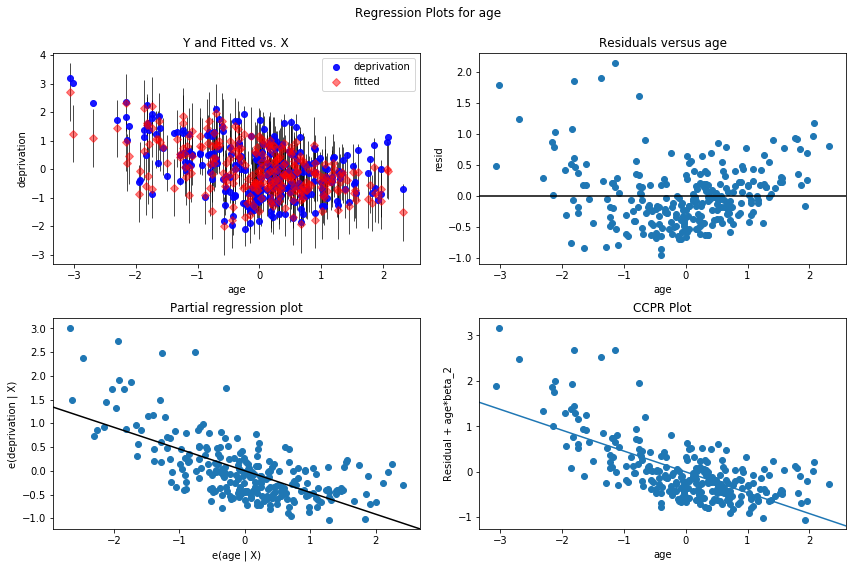

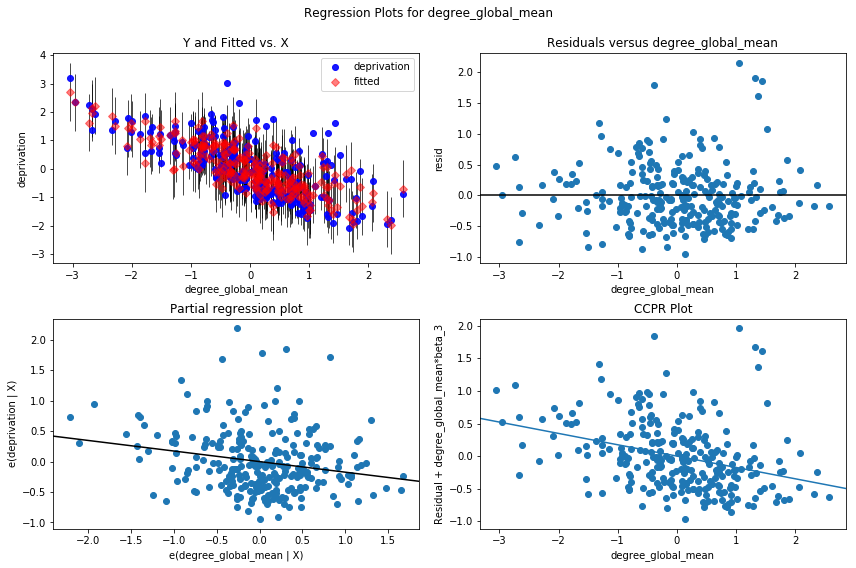

In [288]:
model_deprivation = ols('deprivation ~ employment + age + degree_global_mean', data=data).fit()
res = analyze(model_deprivation)

We can similarly model relationships to other well-being outcomes.

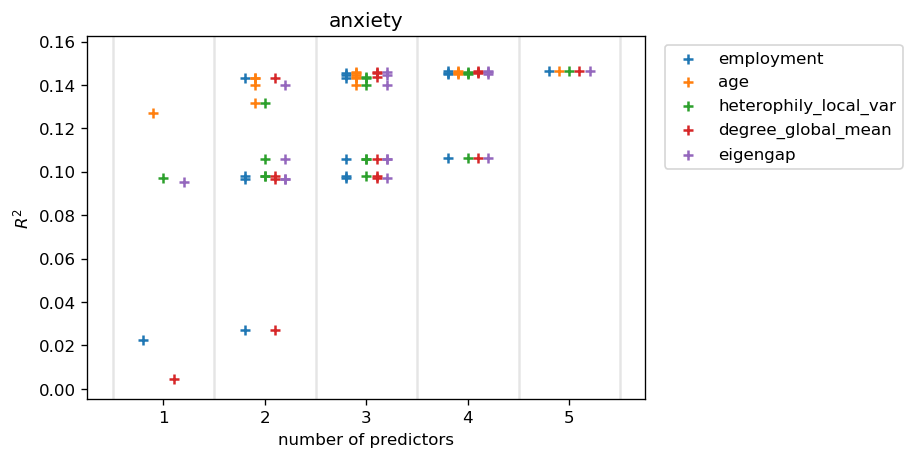

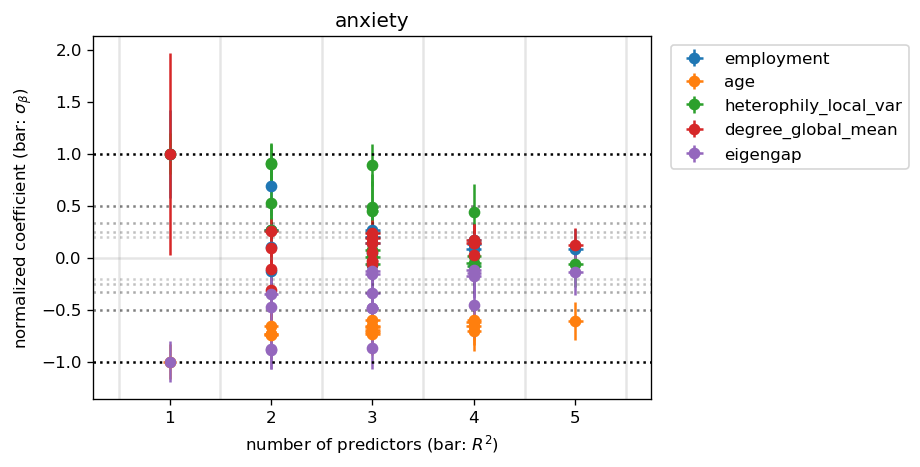

In [289]:
models_anxiety = models(data, 'anxiety', ['employment', 'age', 'heterophily_local_var', 'degree_global_mean', 'eigengap'])

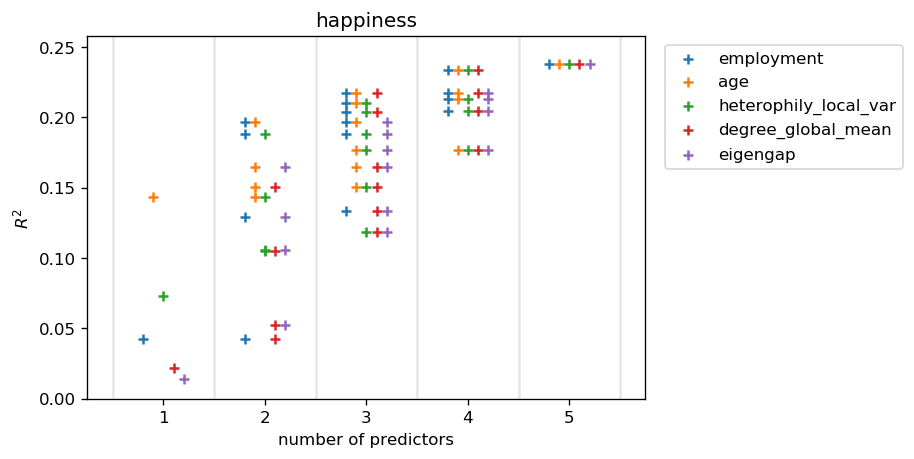

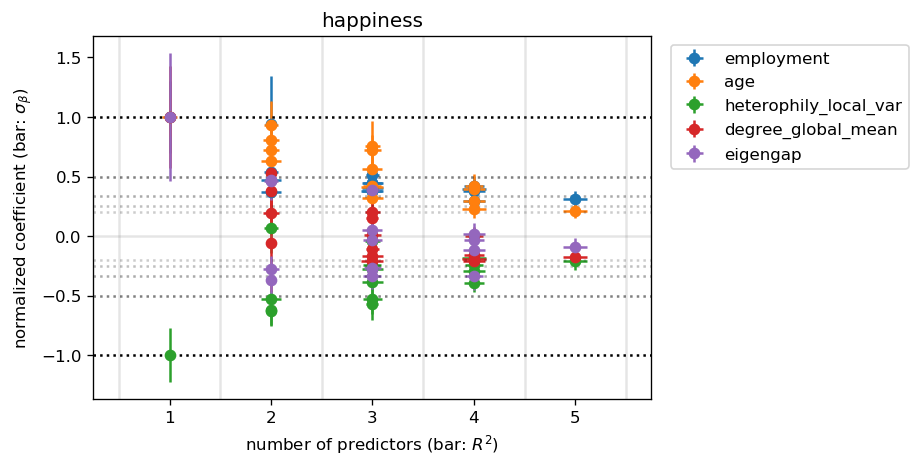

In [290]:
models_happiness = models(data, 'happiness', ['employment', 'age', 'heterophily_local_var', 'degree_global_mean', 'eigengap'])

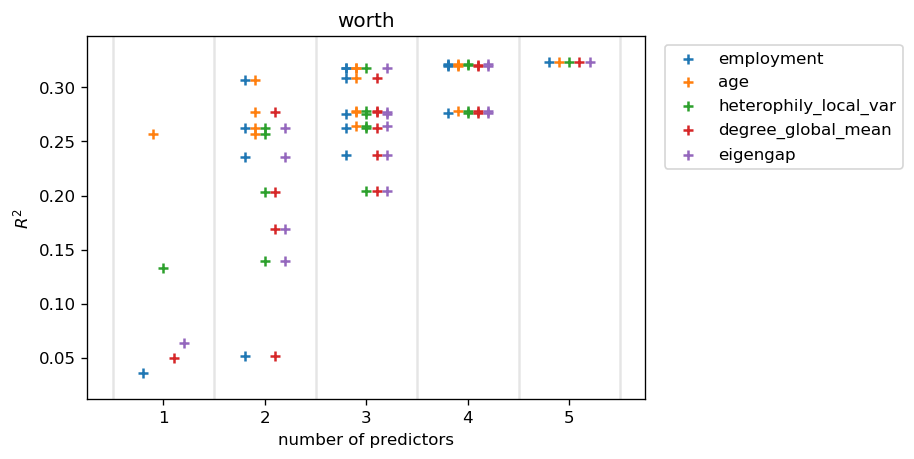

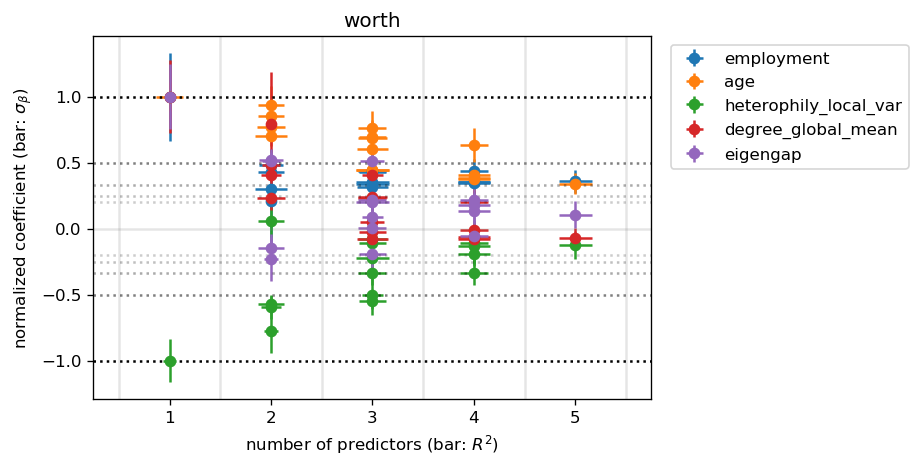

In [296]:
models_worth = models(data, 'worth', ['employment', 'age', 'heterophily_local_var', 'degree_global_mean', 'eigengap'])

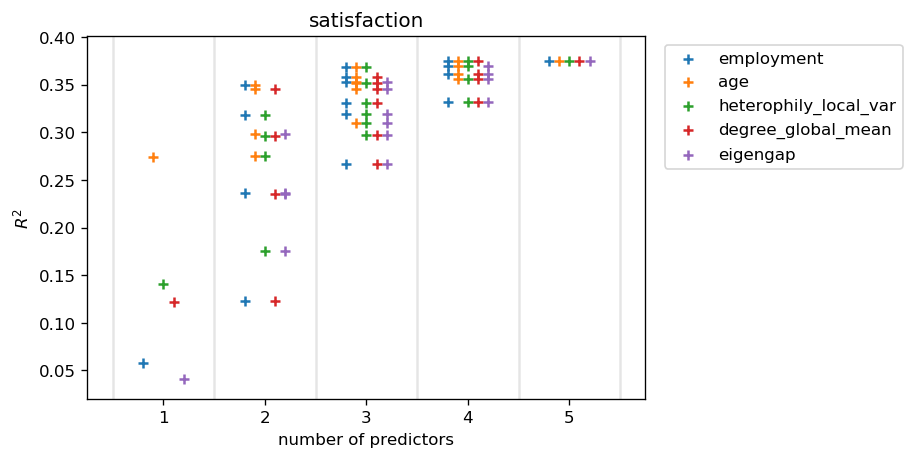

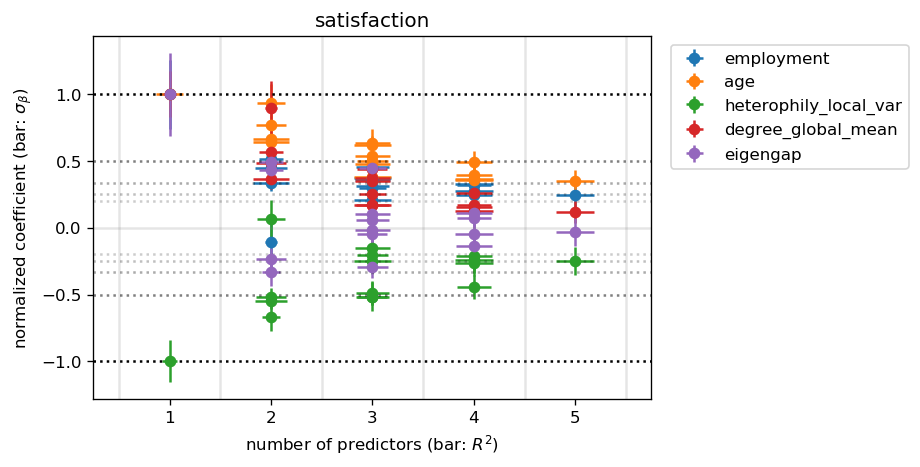

In [297]:
models_satisfaction = models(data, 'satisfaction', ['employment', 'age', 'heterophily_local_var', 'degree_global_mean', 'eigengap'])

Alone, all of these seem to be most well-predicted by age, followed by (at least one of) the network measures, and then employment. For pairwise predictors, age and employment together explain the most variation, followed closely by age and the other network measures.

# Individual-level Analysis

In [685]:
def import_gla2la(name='ew', datapath='./ons/'):
    import pandas as pd
    geo = pd.read_csv(datapath+'geocodes.csv', index_col=0)
    cty = {'ew':['E','W'], 's':['S'], 'n':['N']}
    if name=='ew': geo = geo[geo['gor_code'].str.startswith('E') | geo['gor_code'].str.startswith('W')]
    elif name=='s': geo = geo[geo['gor_code'].str.startswith('S')]
    elif name=='n': geo = geo[geo['gor_code'].str.startswith('N')]
    else: raise ValueError('unexpected name %s'%name)
    gla = [[int(y) for y in x.split(',')] for x in geo['gla_code']]
    gla2la = dict()
    la2gla = dict()
    gla2gor = dict()
    glaname = dict()
    for i in range(len(gla)):
        for j in gla[i]:
            lac = geo.loc[geo.index[i], 'la_code']
            if j in gla2la:
                gla2la[j].append(lac)
                glaname[j].append(geo.loc[geo.index[i], 'la_name'])
            else:
                gla2la[j] = [lac]
                glaname[j] = [geo.loc[geo.index[i], 'la_name']]
                gla2gor[j] = geo.loc[geo.index[i], 'gor_name']
            if lac in la2gla: la2gla[lac].append(j)
            else: la2gla[lac] = [j]                
    for gla in glaname: glaname[gla] = ' and '.join(glaname[gla])
    return {'gla2la':gla2la, 'la2gla':la2gla, 'name':glaname, 'gla2gor':gla2gor}

In [989]:
def import_data_ind(ordinal=True, joint=False):
    import pandas as pd
    filename = 'sas_indiv'
    if ordinal: filename += '_ord'
    if not joint: filename += '_ind'
    filename += '.xlsx'
    sas = pd.read_excel(filename, sheet_name=None, index_col=0)    
    sas['outcomes'] = pd.read_csv('usoc_wave3_wellbeing.csv', index_col=0)
    return sas

In [1004]:
data_ind = import_data_ind()

In [1005]:
data_ind['global'].head()

,sas,deg,deg const-rho,deg const-ohm
"sex:female,ethnicity:black,employment:employed,age:20.0,education:level-0,income:DE",-31.515148,2.994364,2.994364,3.283211
"sex:female,ethnicity:black,employment:employed,age:20.0,education:level-0,income:C2",-30.069785,2.667907,2.667907,3.283211
"sex:female,ethnicity:black,employment:employed,age:20.0,education:level-0,income:C1",-30.746629,2.422063,2.422063,3.283211
"sex:female,ethnicity:black,employment:employed,age:20.0,education:level-0,income:AB",-30.188011,2.516097,2.516097,3.283211
"sex:female,ethnicity:black,employment:employed,age:20.0,education:level-1,income:DE",-36.232086,3.093625,3.093625,3.283211


In [1006]:
def calculate_statistics(data, norm=True, outlier=6):
    from pandas import DataFrame, concat
    import numpy as np
    gla2la = import_gla2la()
    statistics = list(set(data)-{'global', 'outcomes'})
    atts = ['sex', 'ethnicity', 'employment', 'age', 'education', 'income']
    all_stats = []
    all_stats_global = []
    for idx, row in data['outcomes'].iterrows():
        blau_coord = ','.join([str(att)+':'+str(row[att]) for att in atts])
        lac = row['geocode']
        if lac in gla2la['la2gla']:
            gla = gla2la['la2gla'][row['geocode']]
            stats = []
            stats_global = []
            for stat in statistics:
                try: stats.append(data[stat].loc[blau_coord, gla].mean())
                except: stats.append(np.nan)
                try: stats_global.append(data['global'][stat][blau_coord])
                except: stats_global.append(np.nan)
            all_stats.append(stats)
            all_stats_global.append(stats_global)
        else:
            all_stats.append([np.nan for stat in statistics])
            all_stats_global.append([np.nan for stat in statistics])
    out = DataFrame(all_stats, index=data['outcomes'].index, columns=[stat+'_local' for stat in statistics]).join(DataFrame(all_stats_global, index=data['outcomes'].index, columns=[stat+'_global' for stat in statistics]))
    for att in atts: out[att] = data['outcomes']['encoded_'+att]
    out = out.join(data['outcomes'], rsuffix='_orig')
    if norm:
        for key in out:
            if set(out[key].value_counts().index)!={0, 1}:
                try: 
                    out[key] = (out[key]-out[key].mean())/out[key].std()
                    if outlier is not None: out[key][np.abs(out[key])>outlier] = np.nan
                except: pass
    out.columns = ['_'.join(('_'.join(x.split())).split('-')) for x in out.columns]
    return out

In [1007]:
usoc_stats = calculate_statistics(data_ind)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [1008]:
print(list(usoc_stats))

['sas_local', 'deg_local', 'deg_const_ohm_local', 'deg_const_rho_local', 'sas_global', 'deg_global', 'deg_const_ohm_global', 'deg_const_rho_global', 'sex', 'ethnicity', 'employment', 'age', 'education', 'income', 'alcohol', 'drug_frequency', 'wellbeing_likert', 'wellbeing_caseness', 'anxiety', 'health', 'worth', 'happiness', 'satisfaction', 'smoking', 'smoking_frequency', 'alcohol_frequency', 'region', 'geocode', 'sex_orig', 'sex_nom_1', 'sex_nom_2', 'sex_nom_3', 'age_orig', 'age_prop', 'age_nom_1', 'age_nom_2', 'age_nom_3', 'ethnicity_orig', 'ethnicity_prop', 'ethnicity_nom_1', 'ethnicity_nom_2', 'ethnicity_nom_3', 'education_orig', 'education_prop', 'employment_orig', 'employment_prop', 'employment_nom_1', 'employment_nom_2', 'employment_nom_3', 'income_orig', 'income_prop', 'distance_prop', 'distance_nom_1', 'distance_nom_2', 'distance_nom_3', 'family_prop', 'num_friends', 'encoded_age', 'encoded_income', 'encoded_sex', 'encoded_ethnicity', 'encoded_employment', 'encoded_education',

In [1114]:
def plot_multiple(data, x, y, height=4, width=4, kind='bar'):
    if isinstance(x, str): x = [x]
    if isinstance(y, str): y = [y]
    plt.figure(figsize=(width*len(y), height*len(x)))
    for i in range(len(x)):
        for j in range(len(y)):
            plt.subplot(len(x), len(y), i*len(y)+j+1)
            if x[i]!=y[j]:
                if kind=='bar': sns.barplot(x=x[i], y=y[j], data=data)
                elif kind=='box': sns.boxplot(x=x[i], y=y[j], data=data)
                elif kind=='kde':
                    tmp = data[[x[i], y[j]]].dropna()
                    sns.kdeplot(tmp[x[i]], tmp[y[j]], shade=True)
    plt.show()

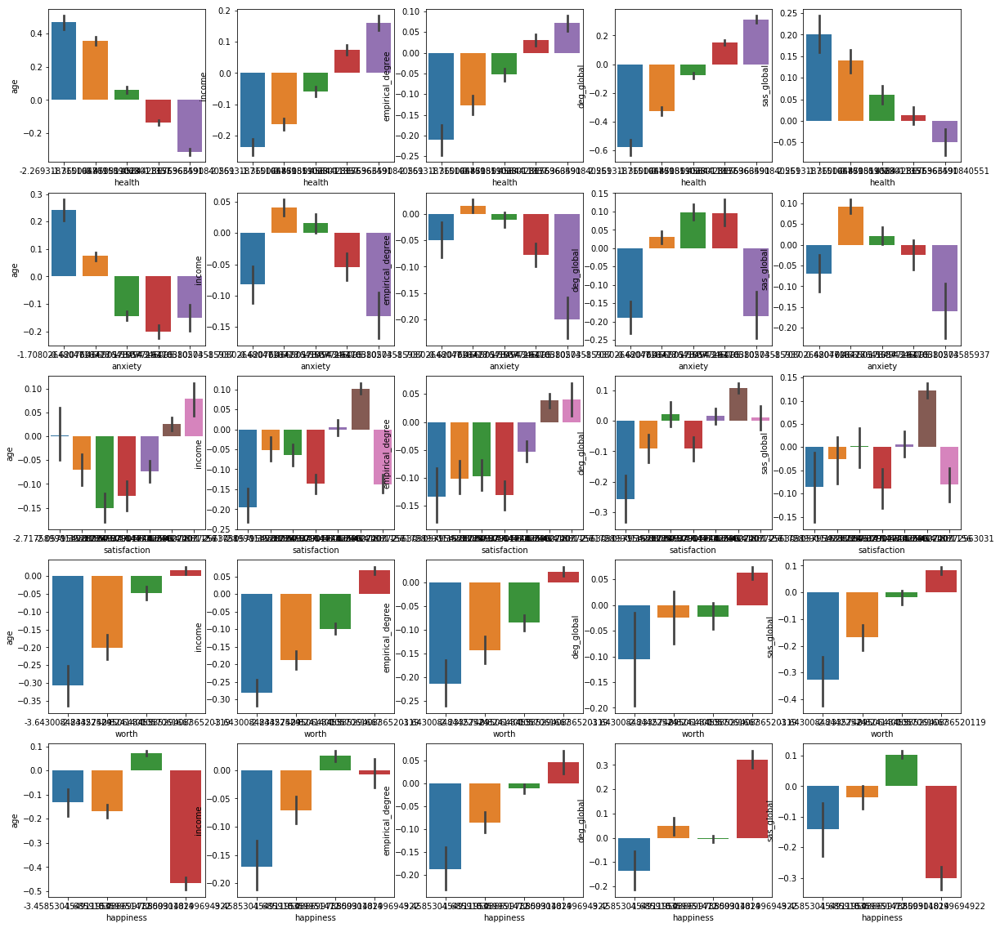

In [1106]:
plot_multiple(usoc_stats, ['health', 'anxiety', 'satisfaction', 'worth', 'happiness'], ['age', 'income', 'empirical_degree', 'deg_global', 'sas_global'])

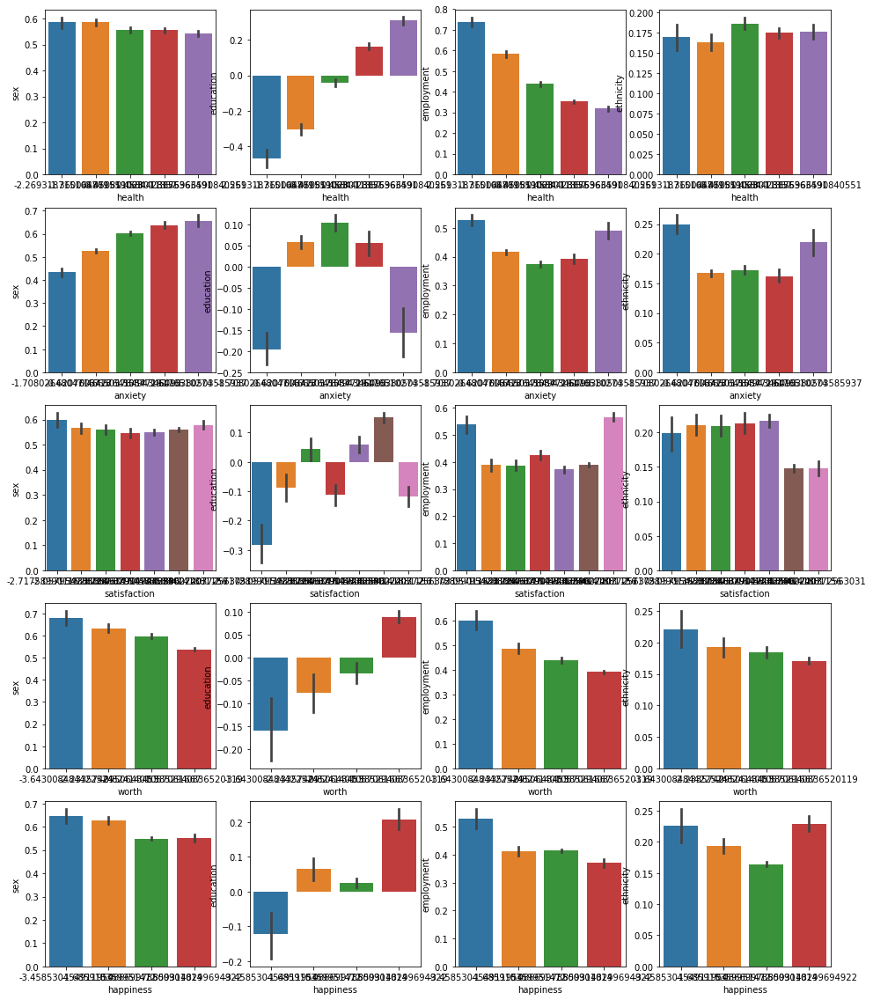

In [1081]:
plot_multiple(usoc_stats, ['health', 'anxiety', 'satisfaction', 'worth', 'happiness'], ['sex', 'education', 'employment', 'ethnicity'])

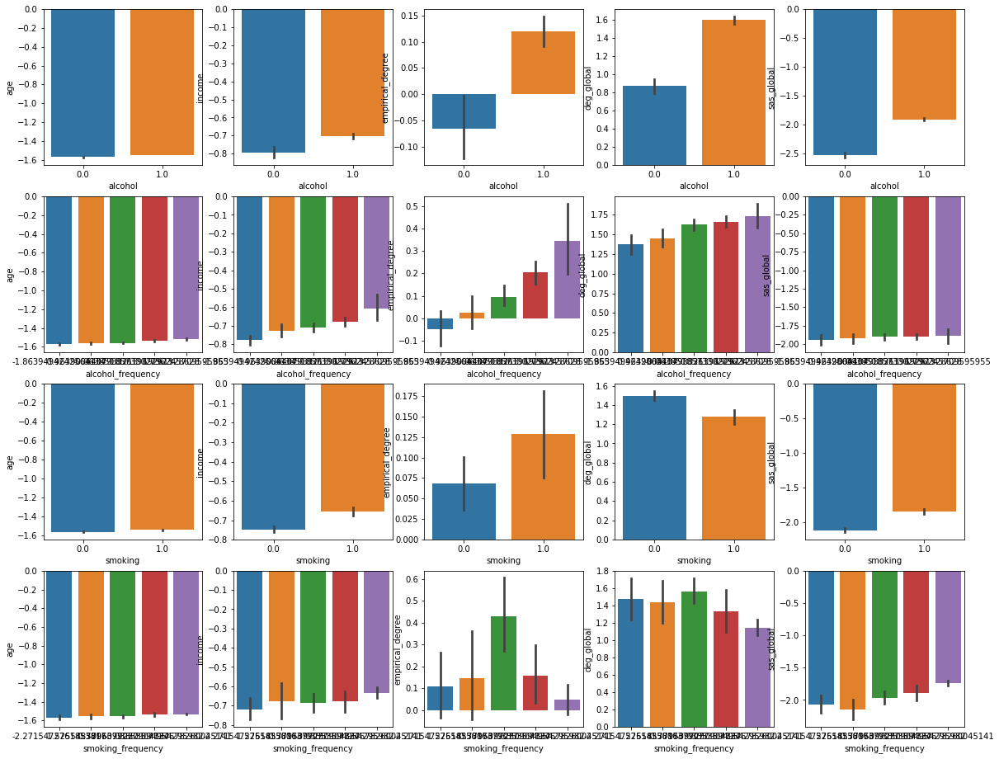

In [1107]:
plot_multiple(usoc_stats, ['alcohol', 'alcohol_frequency', 'smoking', 'smoking_frequency'], ['age', 'income', 'empirical_degree', 'deg_global', 'sas_global'])

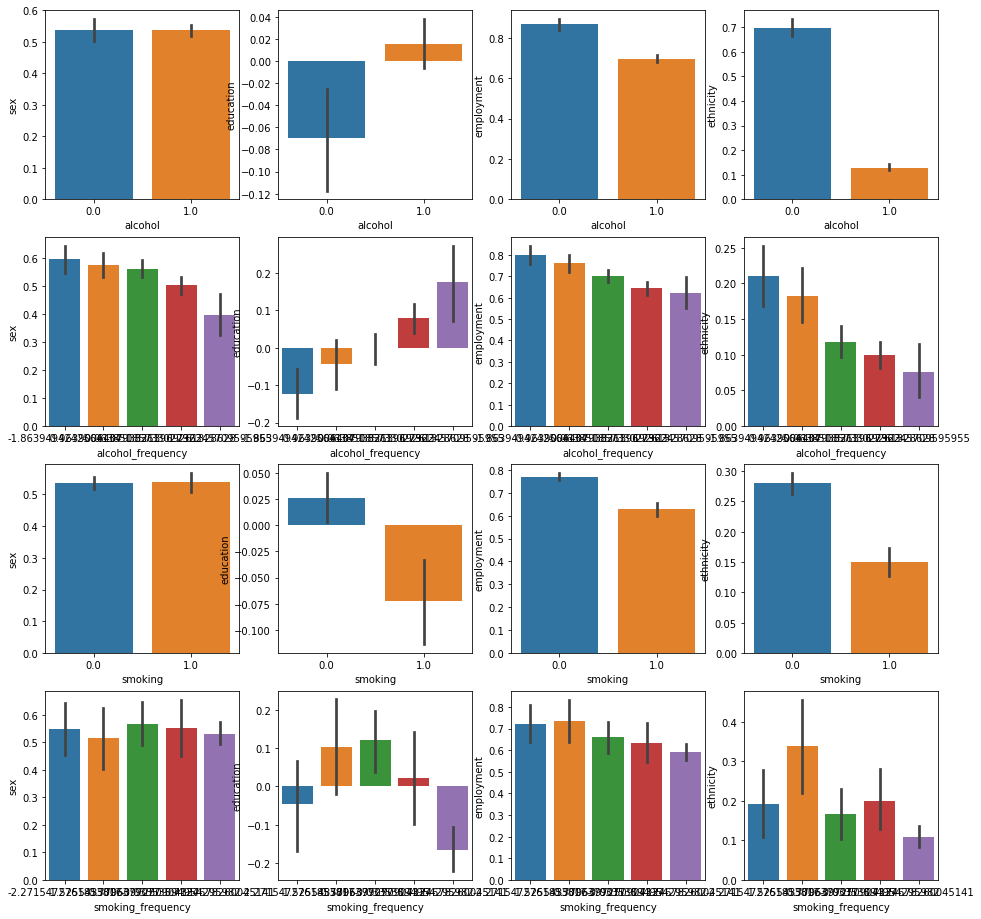

In [1083]:
plot_multiple(usoc_stats, ['alcohol', 'alcohol_frequency', 'smoking', 'smoking_frequency'], ['sex', 'education', 'employment', 'ethnicity'])

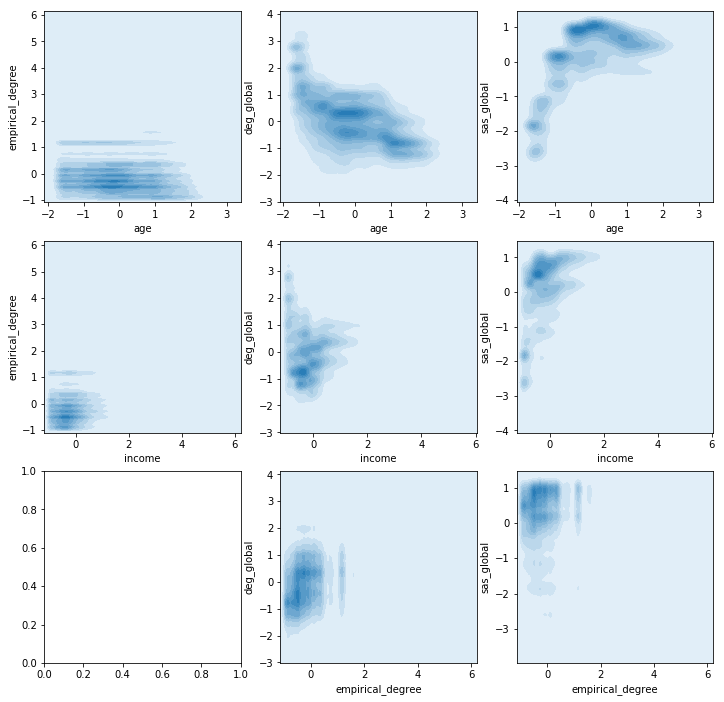

In [1111]:
plot_multiple(usoc_stats, ['age', 'income', 'empirical_degree'], ['empirical_degree', 'deg_global', 'sas_global'], kind='kde')

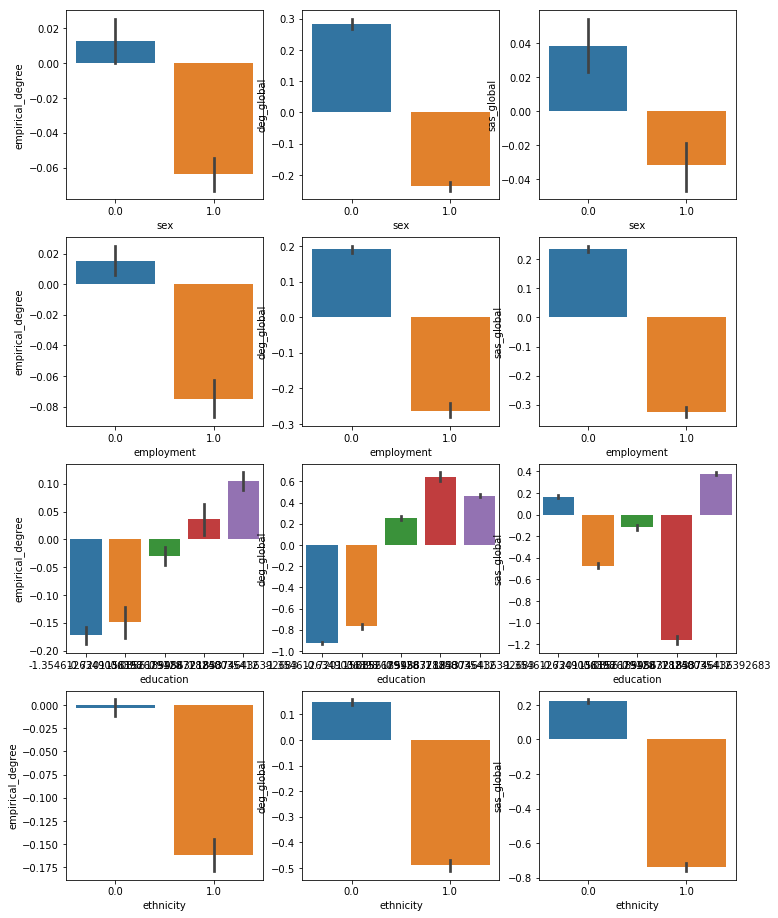

In [1109]:
plot_multiple(usoc_stats, ['sex', 'employment', 'education', 'ethnicity'], ['empirical_degree', 'deg_global', 'sas_global'])

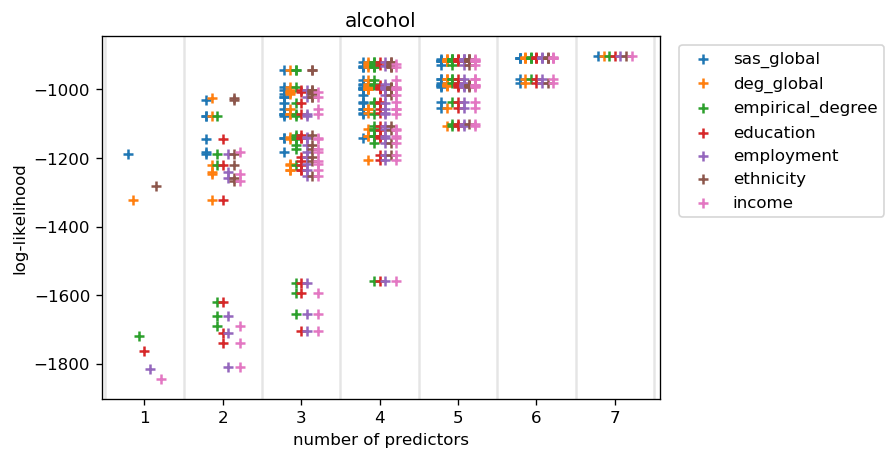

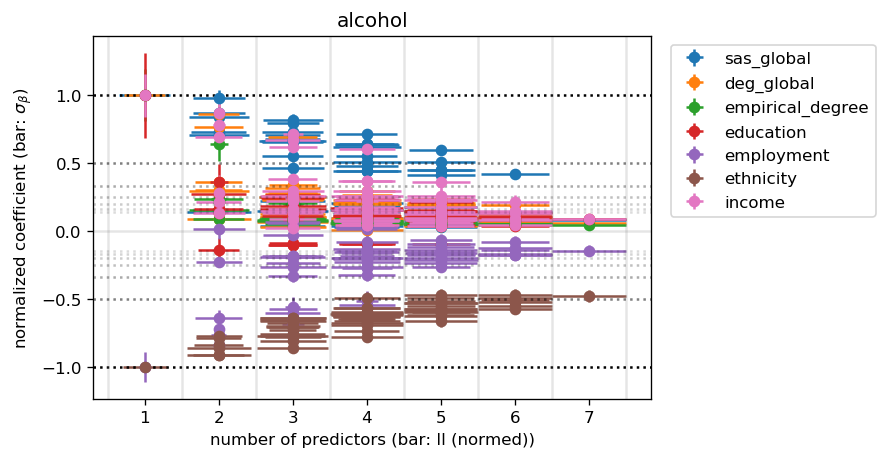

In [1112]:
models_alcohol = models(usoc_stats, 'alcohol', ['sas_global', 'deg_global', 'empirical_degree', 'education', 'employment', 'ethnicity', 'income'], binary=True)

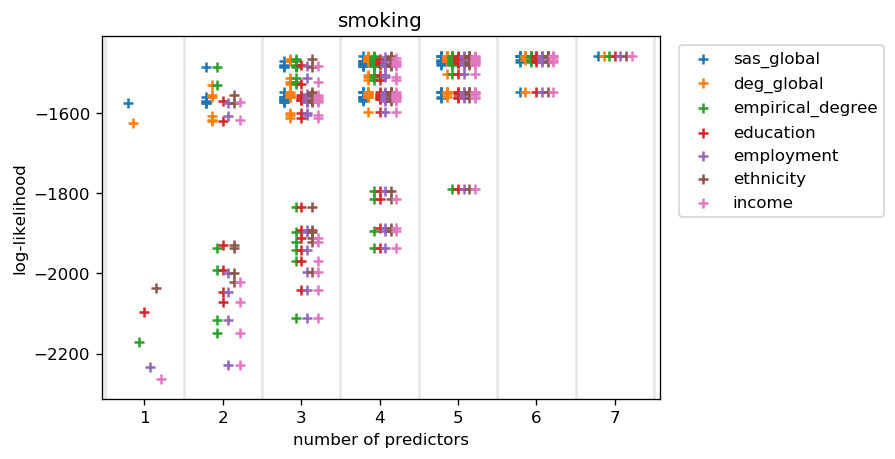

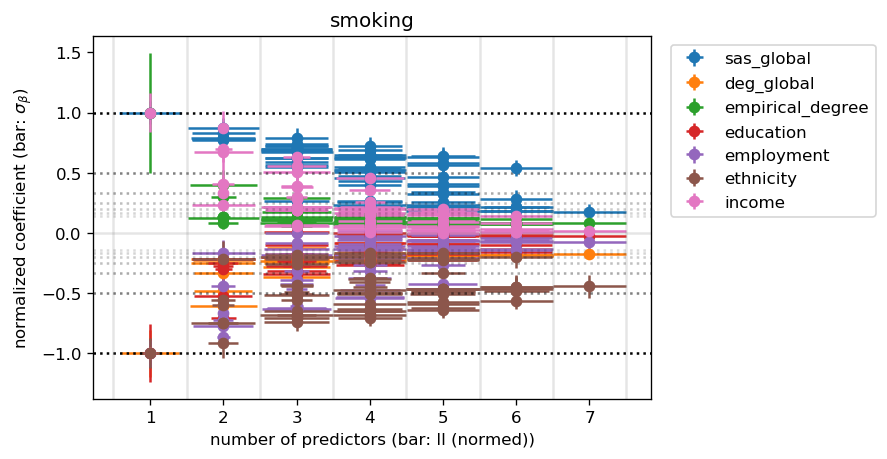

In [1115]:
models_smoking = models(usoc_stats, 'smoking', ['sas_global', 'deg_global', 'empirical_degree', 'education', 'employment', 'ethnicity', 'income'], binary=True)

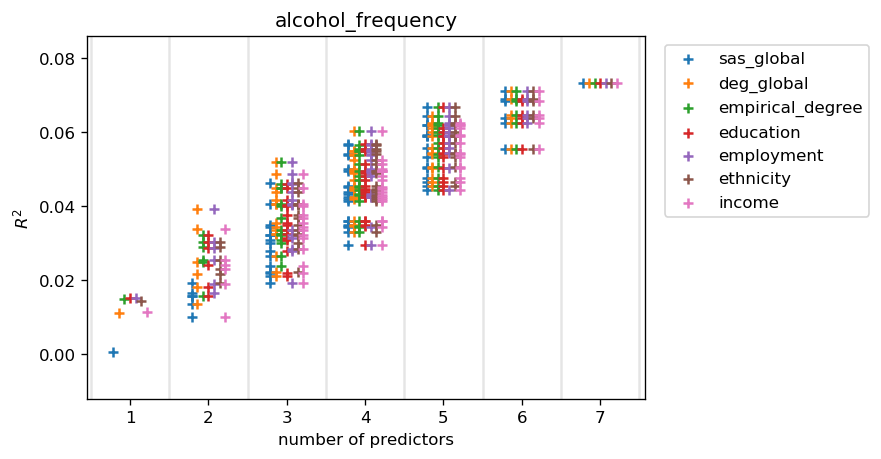

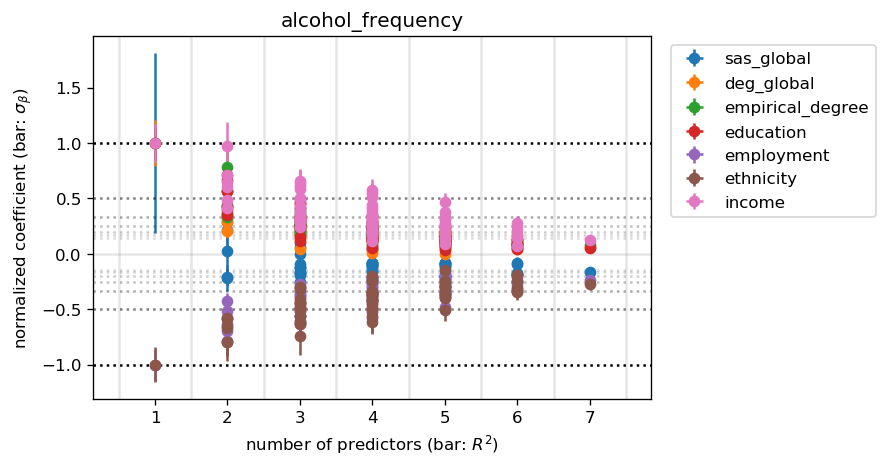

In [1113]:
models_alcoholfrequency = models(usoc_stats, 'alcohol_frequency', ['sas_global', 'deg_global', 'empirical_degree', 'education', 'employment', 'ethnicity', 'income'])

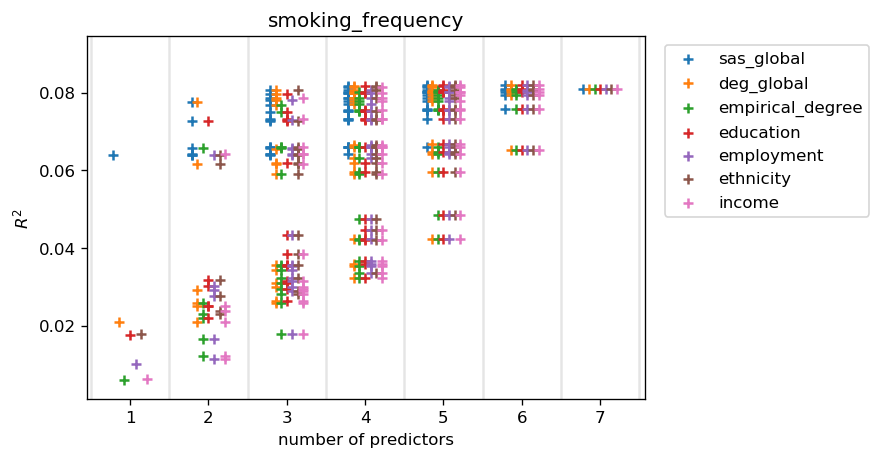

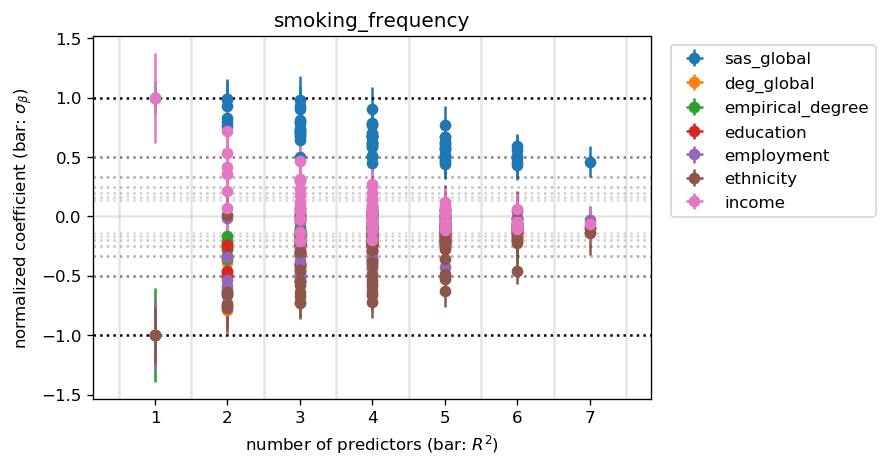

In [1116]:
models_smokingfrequency = models(usoc_stats, 'smoking_frequency', ['sas_global', 'deg_global', 'empirical_degree', 'education', 'employment', 'ethnicity', 'income'])

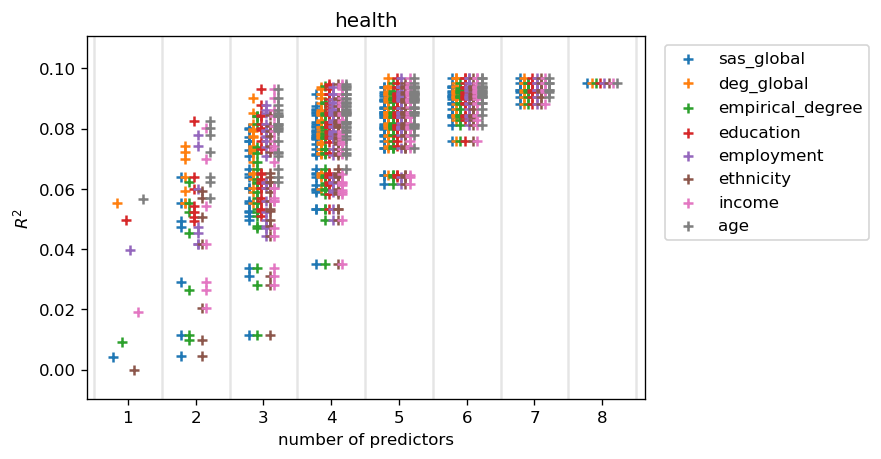

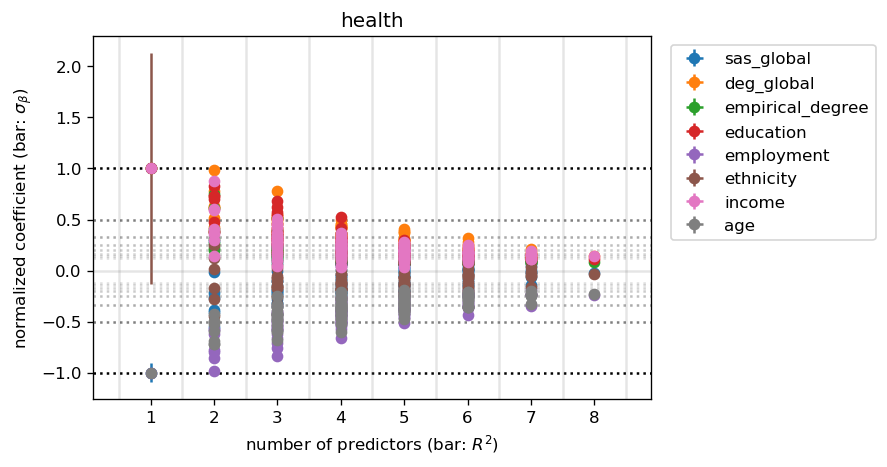

In [1117]:
models_health = models(usoc_stats, 'health', ['sas_global', 'deg_global', 'empirical_degree', 'education', 'employment', 'ethnicity', 'income', 'age'])

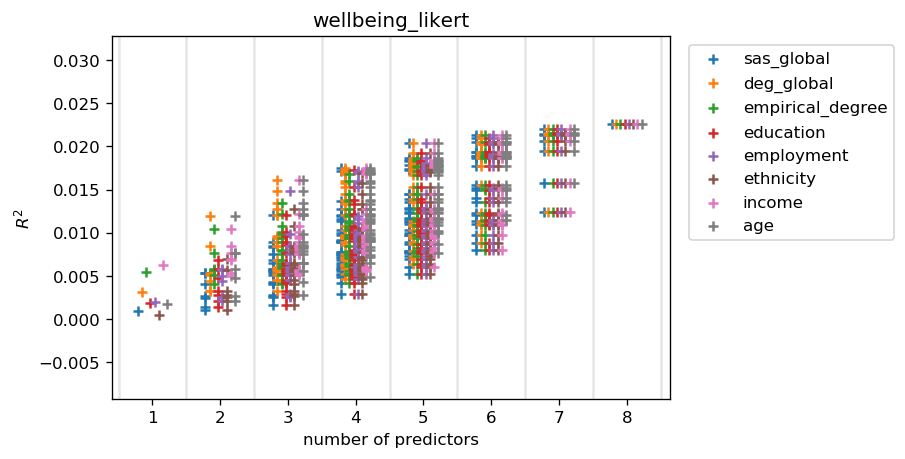

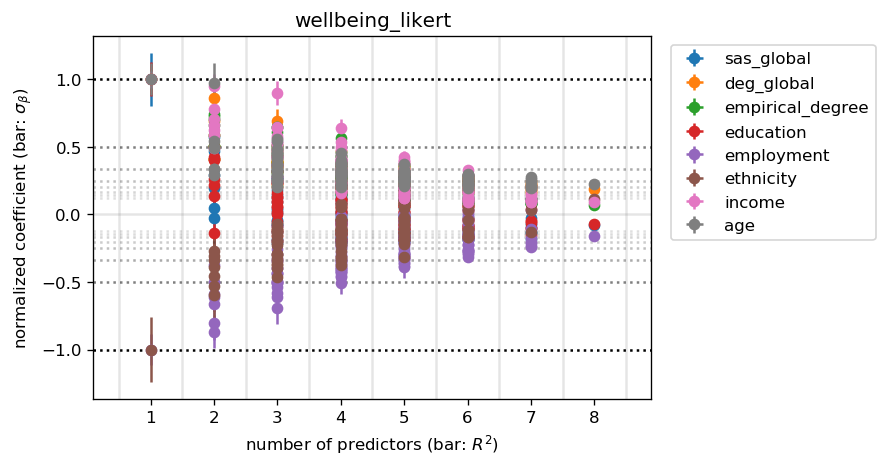

In [1118]:
models_wellbeing = models(usoc_stats, 'wellbeing_likert', ['sas_global', 'deg_global', 'empirical_degree', 'education', 'employment', 'ethnicity', 'income', 'age'])

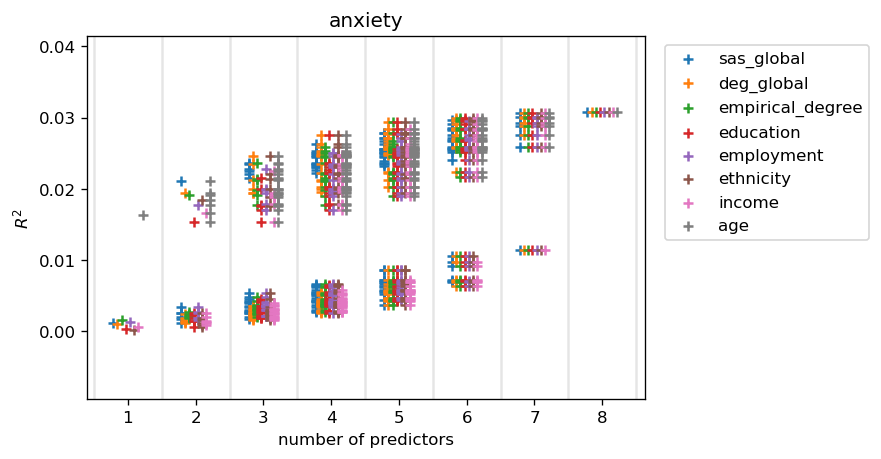

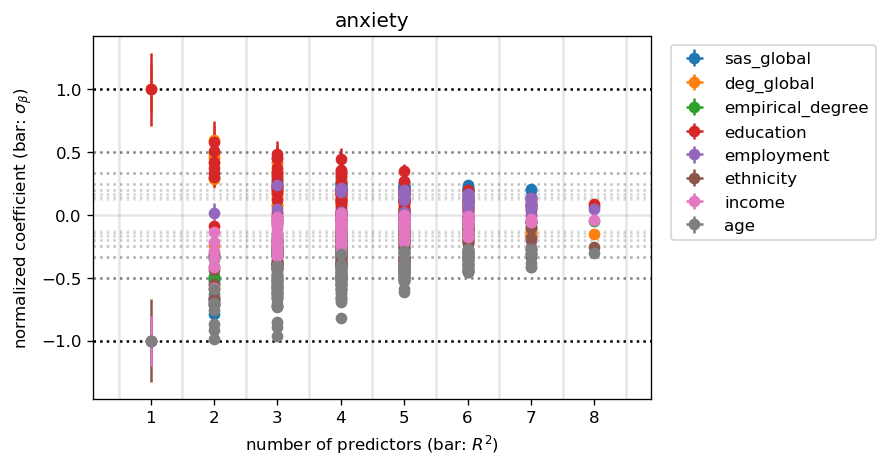

In [1119]:
models_anxiety = models(usoc_stats, 'anxiety', ['sas_global', 'deg_global', 'empirical_degree', 'education', 'employment', 'ethnicity', 'income', 'age'])

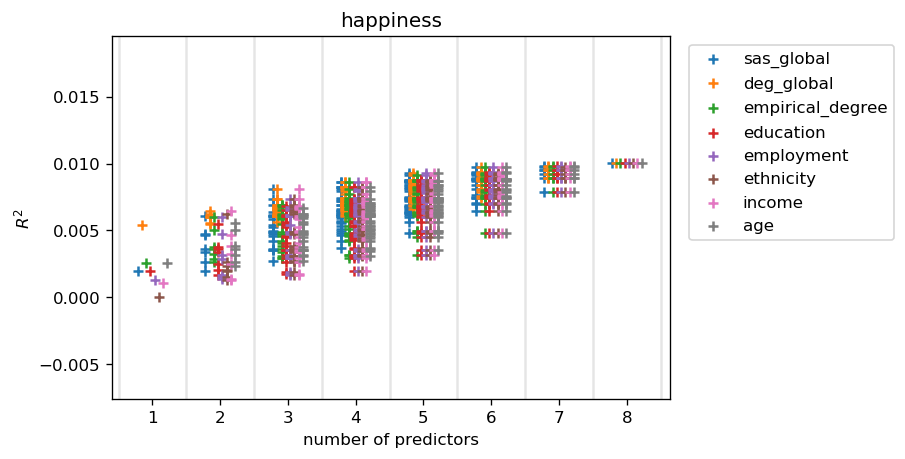

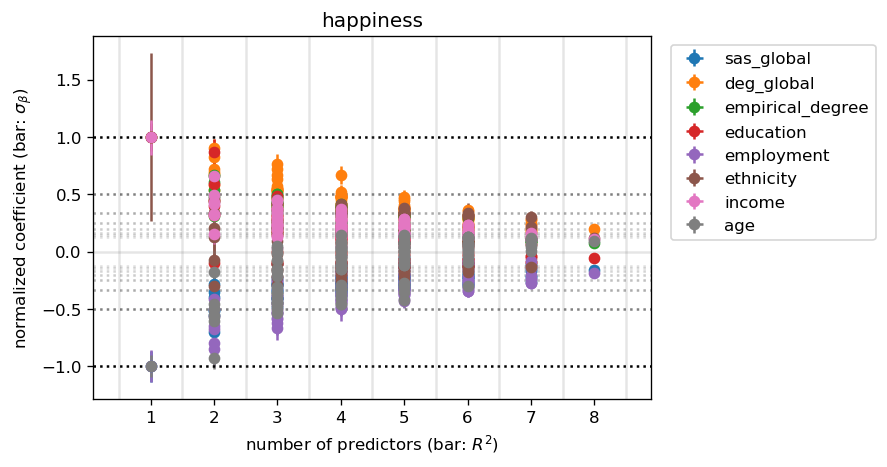

In [1120]:
models_happiness = models(usoc_stats, 'happiness', ['sas_global', 'deg_global', 'empirical_degree', 'education', 'employment', 'ethnicity', 'income', 'age'])

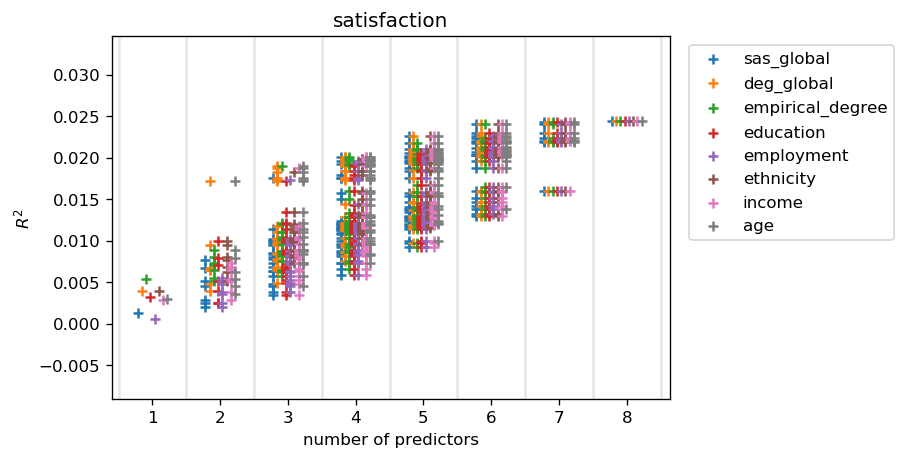

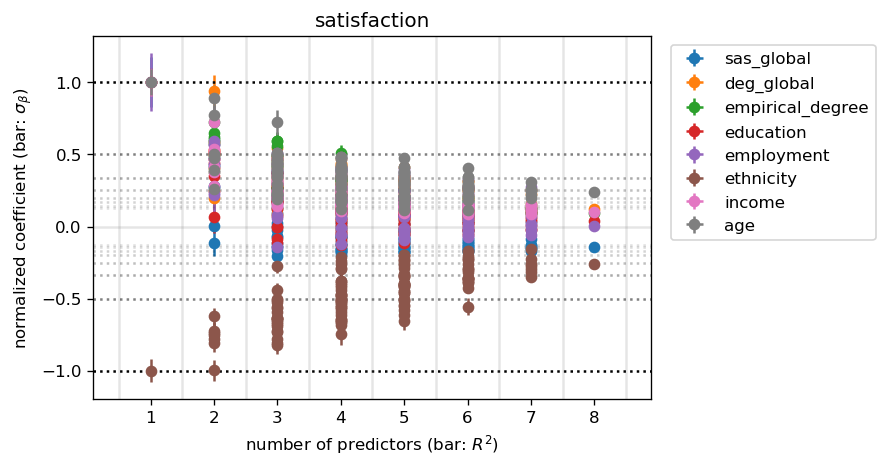

In [1121]:
models_satisfaction = models(usoc_stats, 'satisfaction', ['sas_global', 'deg_global', 'empirical_degree', 'education', 'employment', 'ethnicity', 'income', 'age'])

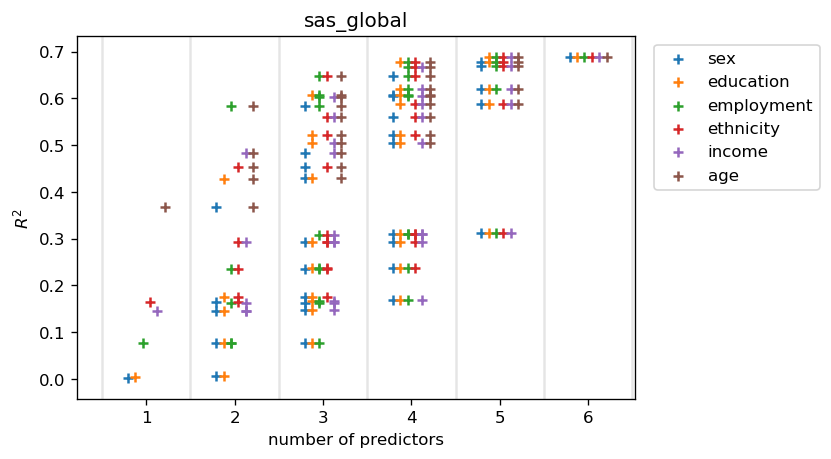

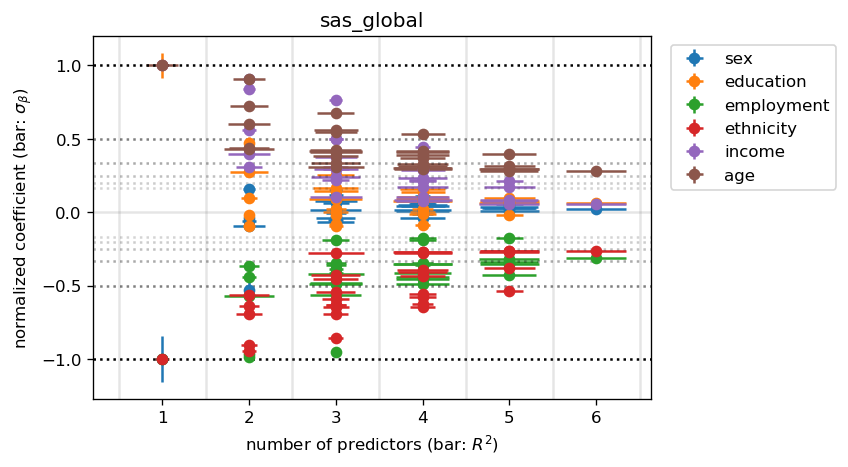

In [1122]:
models_sas = models(usoc_stats, 'sas_global', ['sex', 'education', 'employment', 'ethnicity', 'income', 'age'])

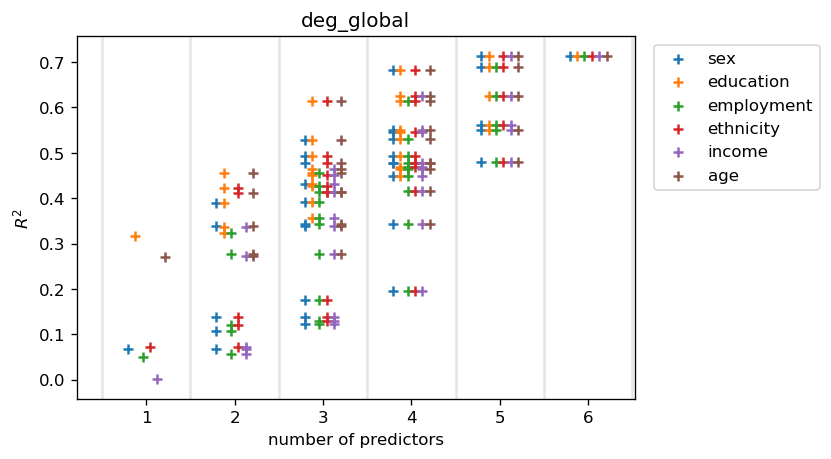

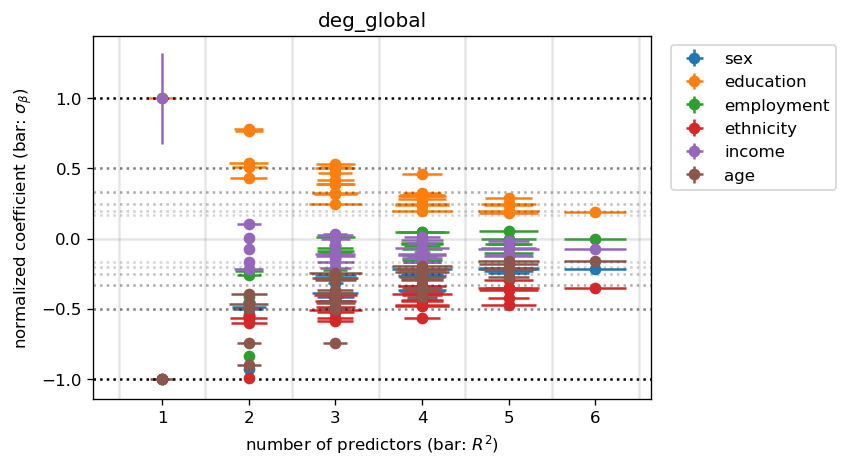

In [1123]:
models_deg = models(usoc_stats, 'deg_global', ['sex', 'education', 'employment', 'ethnicity', 'income', 'age'])

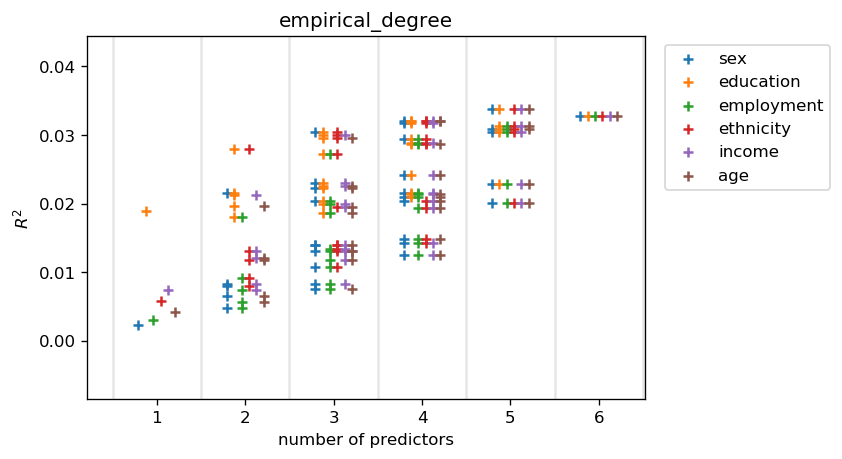

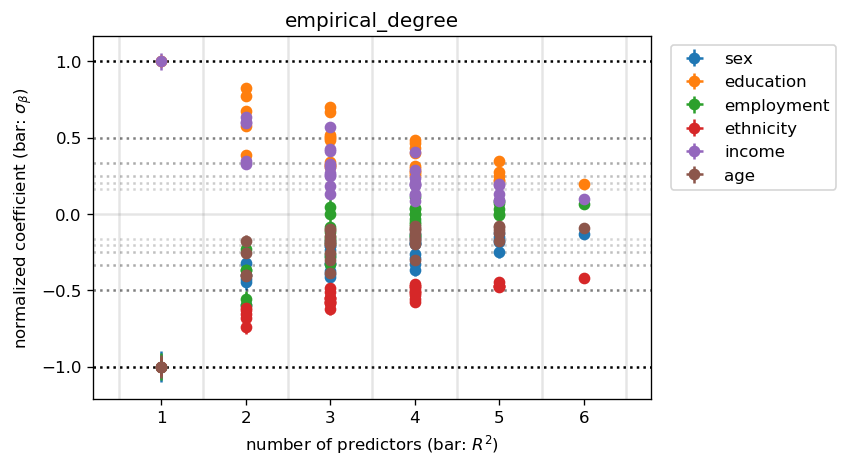

In [1124]:
models_empdeg = models(usoc_stats, 'empirical_degree', ['sex', 'education', 'employment', 'ethnicity', 'income', 'age'])

In [1125]:
data_ind_joint = import_data_ind(joint=True)

In [1131]:
usoc_stats_joint = calculate_statistics(data_ind_joint)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [1130]:
data_ind_joint['sas'].head()

,1,2,3,4,5,6,7,8,9,10,...,256,257,258,259,260,261,262,263,264,265
"sex:female,ethnicity:black,employment:employed,age:20.0,education:level-0,income:DE",-26.689038,-25.028911,-26.720881,-27.860609,-27.916899,-27.078176,-26.345255,-25.702297,-28.139322,-24.903980,...,-26.712252,-26.321456,-26.891898,-28.850396,-26.166506,-26.210063,-25.567191,-27.621949,-26.218503,-28.841222
"sex:female,ethnicity:black,employment:employed,age:20.0,education:level-0,income:C2",-25.488501,-24.057917,-25.626935,-26.324172,-26.534878,-25.957024,-25.349436,-24.583455,-26.699794,-23.876419,...,-25.327723,-25.224337,-25.627963,-27.278798,-24.610393,-25.069687,-24.517808,-26.338881,-25.008542,-27.482935
"sex:female,ethnicity:black,employment:employed,age:20.0,education:level-0,income:C1",-26.503852,-25.458280,-26.904588,-26.689275,-27.264717,-27.142288,-26.789894,-25.770401,-27.202751,-25.168112,...,-25.992255,-26.501923,-26.564398,-27.623504,-24.862850,-26.259708,-25.855053,-27.231686,-25.977367,-28.414056
"sex:female,ethnicity:black,employment:employed,age:20.0,education:level-0,income:AB",-25.979802,-24.886782,-26.402457,-26.240156,-26.790756,-26.596096,-26.262076,-25.254655,-26.633540,-24.558982,...,-25.557497,-25.996698,-26.042462,-27.190451,-24.388175,-25.776678,-25.330125,-26.680305,-25.429480,-27.986313
"sex:female,ethnicity:black,employment:employed,age:20.0,education:level-1,income:DE",-31.078150,-29.017918,-30.918664,-33.193209,-32.718617,-31.402056,-30.182031,-29.452366,-33.084655,-28.926743,...,-31.749227,-30.198466,-31.479693,-33.905260,-32.052463,-30.458703,-29.551486,-32.239562,-30.721568,-33.606972


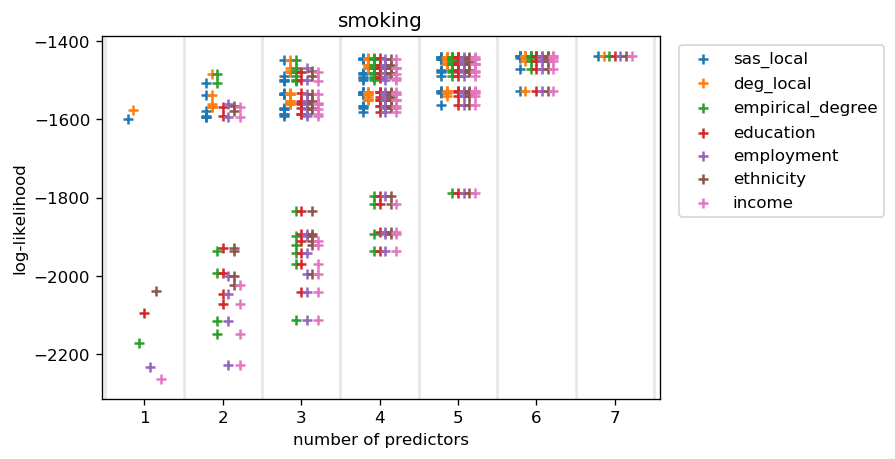

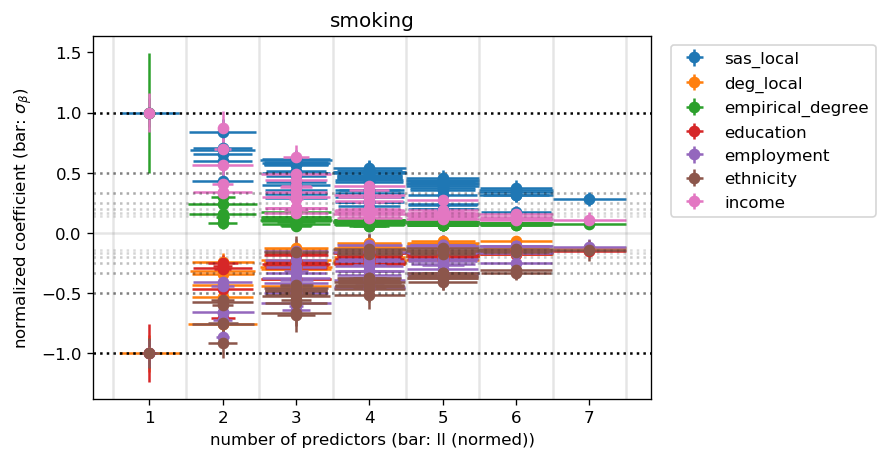

In [1132]:
models_smoking = models(usoc_stats, 'smoking', ['sas_local', 'deg_local', 'empirical_degree', 'education', 'employment', 'ethnicity', 'income'], binary=True)

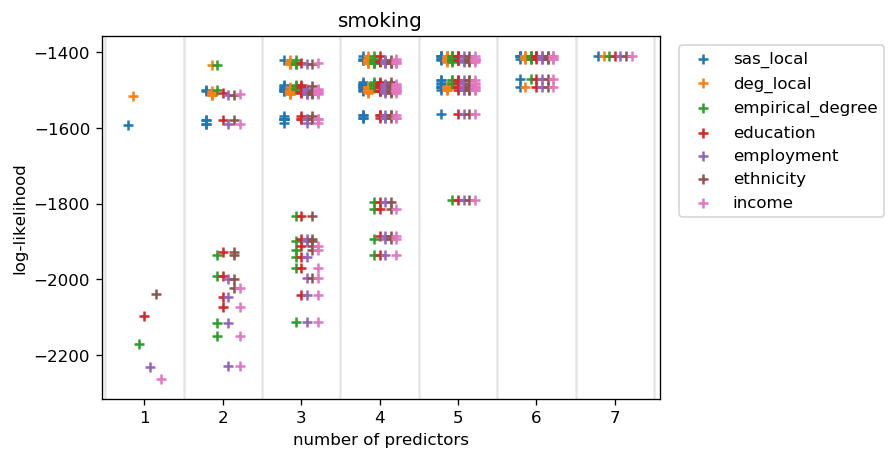

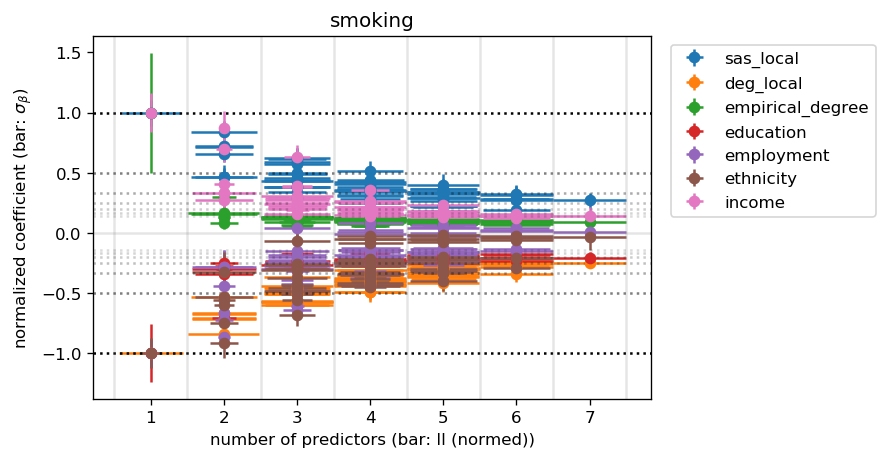

In [1133]:
models_smoking = models(usoc_stats_joint, 'smoking', ['sas_local', 'deg_local', 'empirical_degree', 'education', 'employment', 'ethnicity', 'income'], binary=True)

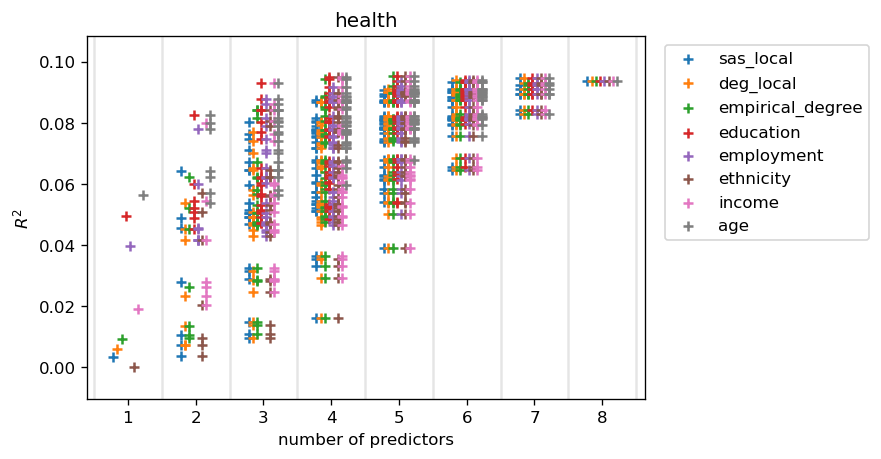

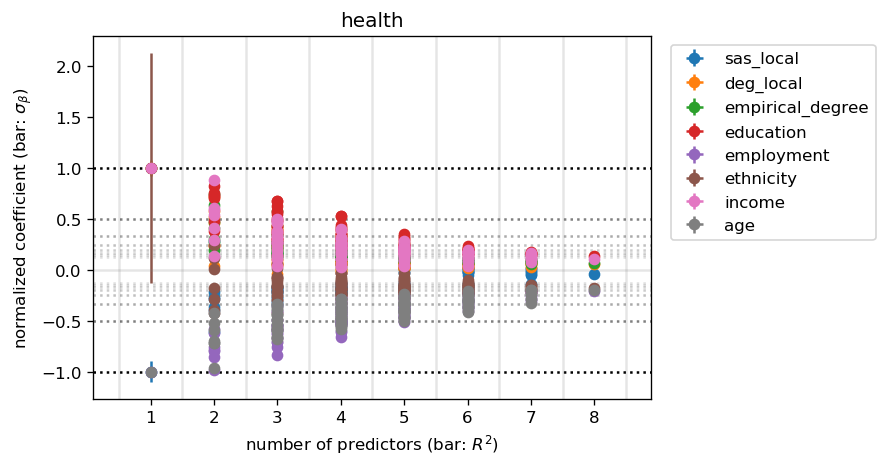

In [1134]:
models_health = models(usoc_stats, 'health', ['sas_local', 'deg_local', 'empirical_degree', 'education', 'employment', 'ethnicity', 'income', 'age'])

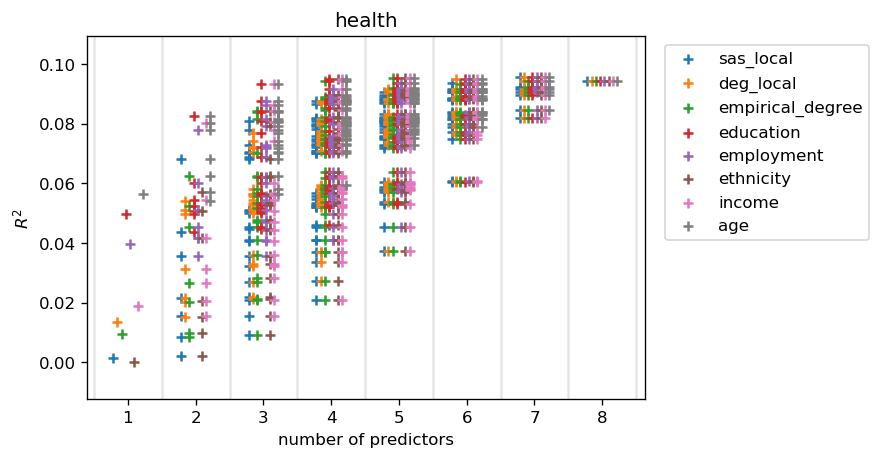

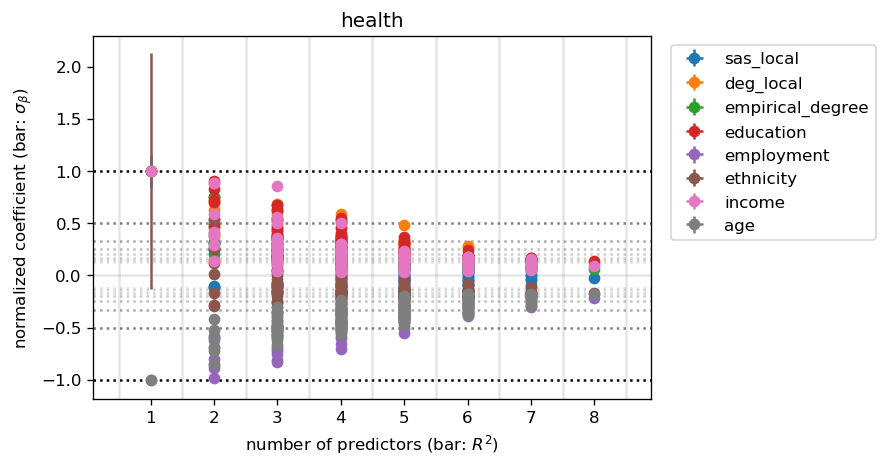

In [1135]:
models_health = models(usoc_stats_joint, 'health', ['sas_local', 'deg_local', 'empirical_degree', 'education', 'employment', 'ethnicity', 'income', 'age'])